In [84]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import matplotlib.patches as patches
import pandas as pd
import sunpy
import sunpy.map
from sunpy.coordinates import (get_earth, get_horizons_coord,
                                Helioprojective, propagate_with_solar_surface)
import sunkit_image
import sunkit_image.coalignment as coalignment
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as const
from astropy.io import fits
import astropy.time
from ndcube import NDCube
from ndcube.extra_coords import (SkyCoordTableCoordinate, TimeTableCoordinate,
                                 QuantityTableCoordinate)
from scipy.interpolate import interp1d
from skimage import draw, measure
import cv2
import alphashape
import irispy
import irispy.io

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)
from ipywidgets import interactive, widgets
from IPython.display import display, clear_output
from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize)
import os
from sun_blinker import SunBlinker
from copy import deepcopy   
from glob import glob
import h5py
import itertools
from tqdm import tqdm

In [2]:
Txshift_hri, Tyshift_hri = (1.66986 + 2.49223)*u.arcsec,(7.60204 - 2.76366 )*u.arcsec

In [3]:
eui_files = sorted(glob("../../src/EUI/HRI/euv174/20221024/coalign_step/*.fits"))
eui_map_seq_coalign = sunpy.map.Map(eui_files[:],sequence=True,memmap=True)

In [4]:
eis_195_velmap_derot_repro_hrifov = sunpy.map.Map("../../src/EIS/DHB_007_v2/20221025T0023/sunpymaps/eis_195_velmap_derot_repro_hrifov.fits")

In [5]:
eis_hhflare_195_velmap_derot_repro_hrifov = sunpy.map.Map("../../src/coalign_map/20221024/eis_hhflare_195_velmap_derot_repro_hrifov.fits")

In [6]:
eui_map_0_shift = eui_map_seq_coalign[0]

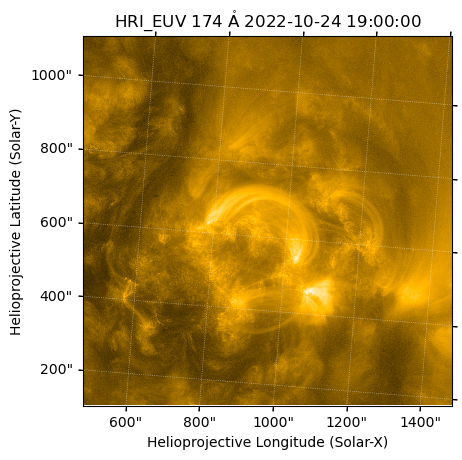

In [7]:
eui_map_0_shift.plot()

In [8]:
eui_map_181_shift = eui_map_seq_coalign[181].shift_reference_coord(Txshift_hri, Tyshift_hri)
eui_map_181_shift.meta["rsun_ref"] = eis_195_velmap_derot_repro_hrifov.meta["rsun_ref"]
eui_map_wcs_all = eui_map_181_shift.wcs

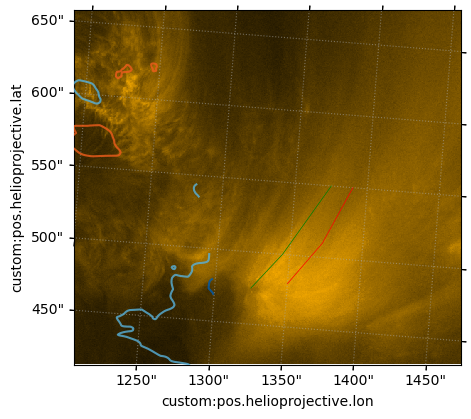

In [9]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
# eui_map_0_shift.plot_settings['norm'] = ImageNormalize(stretch=AsinhStretch(0.1))
# eui_map_0_shift.plot(axes=ax)

ax.imshow(eui_map_0_shift.data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(stretch=AsinhStretch(0.1)),
          interpolation="none")

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(1500,2046)
ax.set_ylim(500,1000)

slit_1_coords = SkyCoord([1325,1345,1375]*u.arcsec,
                         [475,500,550]*u.arcsec,
                         frame=eui_map_181_shift.coordinate_frame)

slit_2_coords = SkyCoord([1350,1372,1390]*u.arcsec,
                            [480,510,550]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

# slit_2_coords = SkyCoord([1360,1385,1405]*u.arcsec,
#                             [470,510,550]*u.arcsec,
#                             frame=eui_map_seq[181].coordinate_frame)

ax.plot_coord(slit_1_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_2_coords, color="red", lw=0.5, ls="-")
ax.grid("on",ls=":",alpha=0.5)

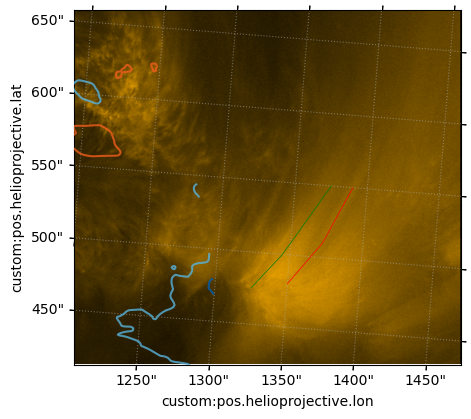

In [10]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
# eui_map_0_shift.plot_settings['norm'] = ImageNormalize(stretch=AsinhStretch(0.1))
# eui_map_0_shift.plot(axes=ax)

ax.imshow(eui_map_seq_coalign[230].data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(stretch=AsinhStretch(0.1)))

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(1500,2046)
ax.set_ylim(500,1000)

# slit_1_coords = SkyCoord([1325,1345,1375]*u.arcsec,
#                          [475,500,550]*u.arcsec,
#                          frame=eui_map_seq[181].coordinate_frame)

# slit_2_coords = SkyCoord([1360,1385,1405]*u.arcsec,
#                             [470,510,550]*u.arcsec,
#                             frame=eui_map_seq[181].coordinate_frame)

ax.plot_coord(slit_1_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_2_coords, color="red", lw=0.5, ls="-")
ax.grid("on",ls=":",alpha=0.5)

In [11]:
def get_intensity_spacetime_cut(slit_coords,map_seq,bresenham=False):
    pixels_0 = sunpy.map.pixelate_coord_path(eui_map_181_shift,slit_coords,bresenham=bresenham)
    pixels_0_distance = np.zeros_like(pixels_0,dtype=np.float64)*u.arcsec

    slit_anchor_index = []
    for slit_anchor_ in slit_coords:
        slit_anchor_index.append(np.argmin(pixels_0.separation(slit_anchor_)))
    slit_anchor_distance = np.zeros_like(slit_anchor_index,dtype=np.float64)
    for ii, slit_anchor_index_ in enumerate(slit_anchor_index):
        if ii == 0:
            pass
        else:
            slit_anchor_distance[ii] = pixels_0[slit_anchor_index[ii]].separation(pixels_0[slit_anchor_index[ii-1]]).to_value(u.arcsec) + slit_anchor_distance[ii-1]
    
    slit_anchor_distance = slit_anchor_distance*u.arcsec

    for ii, slit_anchor_index_ in enumerate(slit_anchor_index[:-1]):
        for jj in range(slit_anchor_index[ii],slit_anchor_index[ii+1]):
            pixels_0_distance[jj] = slit_anchor_distance[ii] + pixels_0[jj].separation(pixels_0[slit_anchor_index_]).to(u.arcsec)
    pixels_0_distance[-1] = slit_anchor_distance[-1] 
    pixels_0_distance = pixels_0_distance.to_value(u.rad)*map_seq[181].dsun
    

    intensity = []
    for map_ in map_seq:
        # pixels_ = sunpy.map.pixelate_coord_path(map_,slit_coords)
        map_fake_ = sunpy.map.Map(map_.data, eui_map_181_shift.meta)
        pixels_ = pixels_0
        pixels_distance_ = pixels_.separation(pixels_[0])
        intensity_ = sunpy.map.sample_at_coords(map_fake_,pixels_)
        intensity.append(intensity_)
        # intensity_interp_func_ = interp1d(pixels_distance_.to_value("arcsec"),intensity_.value,kind="linear",fill_value="extrapolate")
        # intensity.append(intensity_interp_func_(pixels_0_distance.to_value("arcsec"))*intensity_.unit)
    
    return pixels_0, pixels_0_distance, u.Quantity(intensity)

In [12]:
slit_1_pixels_0, slit_1_pixels_0_distance ,slit_1_intensity = get_intensity_spacetime_cut(slit_1_coords,eui_map_seq_coalign)

In [52]:
def pixelate_coord_thick_path(smap, coord_path,thick=1,bresenham=False):
    px, py = smap.wcs.world_to_pixel(coord_path)
    # px, py =  np.rint(px).astype(int),  np.rint(py).astype(int)

    if bresenham:
        px, py = np.rint(px).astype(int), np.rint(py).astype(int)

    pix_x, pix_y = [], []
    for i in range(len(px) - 1):
        this_pix_x, this_pix_y = _intersected_pixels_thick(x1=px[i], y1=py[i], x2=px[i+1], y2=py[i+1],thick=thick,
                                                            bresenham=bresenham)

        # After the first line segment, skip the start point since it is the same as the end point
        # of the previous line segment
        if i > 0:
            this_pix_x = this_pix_x[1:,:]
            this_pix_y = this_pix_y[1:,:]
        pix_x.append(this_pix_x)
        pix_y.append(this_pix_y)
    # pix_x = np.vstack(pix_x)
    # pix_y = np.vstack(pix_y)

    pixel_coords = [smap.wcs.pixel_to_world(pix_x_, pix_y_) for pix_x_, pix_y_ in zip(pix_x, pix_y)]
    return pixel_coords

def _intersected_pixels_thick(*, x1, y1, x2, y2,thick,bresenham=False):
    """
    Returns an array of all pixel coordinates which the line defined by `x1, y1` and
    `x2, y2` crosses.

    Parameters
    ----------
    x1, y1, x2, y2 : `float`
    """
    
    # yy, xx = draw.line(y1, x1, y2, x2)

    if bresenham is False:
        xx, yy = sunpy.map.maputils._intersected_pixels(x1=x1, y1=y1, x2=x2, y2=y2).T
    else:
        xx, yy = sunpy.map.maputils._bresenham(x1=x1, y1=y1, x2=x2, y2=y2).T

    rotation_angle = np.arctan2(y2 - y1, x2 - x1)

    thick = thick/np.cos(rotation_angle/2)

    polygon_x = np.array([0.5, -0.5, -0.5, 0.5])
    polygon_y = np.array([thick, thick, -thick, -thick])

    polygon_x_rot = polygon_x * np.cos(rotation_angle) - polygon_y * np.sin(rotation_angle) 
    polygon_y_rot = polygon_x * np.sin(rotation_angle) + polygon_y * np.cos(rotation_angle) 

    yy_thick_0, xx_thick_0 = draw.polygon(polygon_y_rot + yy[0], polygon_x_rot + xx[0])
    # yy_thick_0, xx_thick_0 = draw.ellipse(yy[0], xx[0], thick, 0.5, rotation=rotation_angle)

    yy_thick = np.zeros((len(yy),len(yy_thick_0)))
    xx_thick = np.zeros((len(xx),len(xx_thick_0)))

    yy_thick[0,:] = yy_thick_0
    xx_thick[0,:] = xx_thick_0

    for ii in range(1, len(yy)):
        yy_thick[ii,:], xx_thick[ii,:] = draw.polygon(polygon_y_rot + yy[ii], polygon_x_rot + xx[ii])
    
    return  xx_thick, yy_thick

In [61]:
def get_intensity_spacetime_cut_new(slit_coords,map_seq,thick=1.5,bresenham=False):
    pixels_0 = pixelate_coord_thick_path(eui_map_181_shift,slit_coords,thick=thick,bresenham=bresenham)
    pixels_center = sunpy.map.pixelate_coord_path(eui_map_181_shift,slit_coords,bresenham=bresenham)

    pixels_center_distance = np.zeros_like(pixels_center,dtype=np.float64)*u.arcsec

    slit_anchor_index = []
    for slit_anchor_ in slit_coords:
        slit_anchor_index.append(np.argmin(pixels_center.separation(slit_anchor_)))
    slit_anchor_distance = np.zeros_like(slit_anchor_index,dtype=np.float64)
    for ii, slit_anchor_index_ in enumerate(slit_anchor_index):
        if ii == 0:
            pass
        else:
            slit_anchor_distance[ii] = pixels_center[slit_anchor_index[ii]].separation(pixels_center[slit_anchor_index[ii-1]]).to_value(u.arcsec) + slit_anchor_distance[ii-1]
    
    slit_anchor_distance = slit_anchor_distance*u.arcsec

    for ii, slit_anchor_index_ in enumerate(slit_anchor_index[:-1]):
        for jj in range(slit_anchor_index[ii],slit_anchor_index[ii+1]):
            pixels_center_distance[jj] = slit_anchor_distance[ii] + pixels_center[jj].separation(pixels_center[slit_anchor_index_]).to(u.arcsec)
    pixels_center_distance[-1] = slit_anchor_distance[-1] 
    pixels_center_distance = pixels_center_distance.to_value(u.rad)*map_seq[181].dsun


    intensity = []
    for map_ in map_seq[:]:
        map_fake_ = sunpy.map.Map(map_.data, eui_map_181_shift.meta)
        intensity_ = np.zeros_like(pixels_center)
        for ii, slit_anchor_index_ in enumerate(slit_anchor_index[:-1]):
            pixels_ = pixels_0[ii]
            if ii == 0:
                intensity_[slit_anchor_index[ii]:slit_anchor_index[ii+1]+1] = \
                    np.nanmean(sunpy.map.sample_at_coords(map_fake_,pixels_.flatten()).reshape(pixels_.shape[0],pixels_.shape[1]),axis=1)
            else:
                intensity_[slit_anchor_index[ii]+1:slit_anchor_index[ii+1]+1] = \
                    np.nanmean(sunpy.map.sample_at_coords(map_fake_,pixels_.flatten()).reshape(pixels_.shape[0],pixels_.shape[1]),axis=1)
        intensity.append(intensity_)
    
    return pixels_center, pixels_center_distance, pixels_0, u.Quantity(intensity)

In [136]:
def get_intensity_spacetime_cut_skimage_profile(slit_coords,map_seq,linewidth=2):
    slit_coords_idx,slit_coords_idy  = eui_map_wcs_all.world_to_pixel(slit_coords)
    # slit_coords_idx,slit_coords_idy = np.rint(slit_coords_idx).astype(int), np.rint(slit_coords_idy).astype(int)

    for ii in range(len(slit_coords_idx)-1):
        pixels_0_idy_, pixels_0_idx_ = measure.profile._line_profile_coordinates((slit_coords_idy[ii], slit_coords_idx[ii]),
                                     (slit_coords_idy[ii+1], slit_coords_idx[ii+1]), linewidth=linewidth)
        if ii == 0:
            pixels_0_idy, pixels_0_idx = pixels_0_idy_, pixels_0_idx_
        else:
            pixels_0_idy = np.vstack((pixels_0_idy,pixels_0_idy_))
            pixels_0_idx = np.vstack((pixels_0_idx,pixels_0_idx_))

    pixels_0_idy_center = np.nanmean(pixels_0_idy,axis=1)
    pixels_0_idx_center = np.nanmean(pixels_0_idx,axis=1)
    pixels_0_center = eui_map_wcs_all.pixel_to_world(pixels_0_idx_center,pixels_0_idy_center)

    pixels_center_distance = []

    for ii, pixels_center_ in enumerate(pixels_0_center):
        if ii == 0:
            pixels_center_distance.append(0*u.arcsec)
        else:
            pixels_center_distance.append(pixels_0_center[ii].separation(pixels_0_center[ii-1]).to(u.arcsec) + pixels_center_distance[ii-1])
    pixels_center_distance = u.Quantity(pixels_center_distance).to_value(u.rad)*map_seq[181].dsun


    intensity = []
    for map_ in map_seq[:]:
        map_fake_ = sunpy.map.Map(map_.data, eui_map_181_shift.meta)
        for ii in range(len(slit_coords_idx)-1):
            line = measure.profile_line(map_fake_.data, (slit_coords_idy[ii], slit_coords_idx[ii]), (slit_coords_idy[ii+1], slit_coords_idx[ii+1]), linewidth=linewidth,
                                    reduce_func=np.nanmean)
            if ii == 0:
                intensity_ = line
            else:
                intensity_ = np.concatenate((intensity_,line))
        
        intensity.append(intensity_)
    
    return pixels_0_center,pixels_center_distance,eui_map_wcs_all.pixel_to_world(pixels_0_idx,pixels_0_idy) ,u.Quantity(intensity)
    


In [140]:
slit_1_pixels_0_skimage_profile,slit_1_pixels_0_distance_skimage_profile, \
slit_1_pixels_0_skimage_profile_all,slit_1_intensity_skimage_profile = get_intensity_spacetime_cut_skimage_profile(slit_1_coords,eui_map_seq_coalign,linewidth=4)

In [62]:
slit_1_pixels_0_bresenham, slit_1_pixels_0_distance_bresenham ,slit_1_intensity_bresenham = \
    get_intensity_spacetime_cut(slit_1_coords,eui_map_seq_coalign,bresenham=True)

In [63]:
slit_1_pixels_0_new, slit_1_pixels_0_distance_new,slit_1_pixels_0_new_all,slit_1_intensity_new = get_intensity_spacetime_cut_new(slit_1_coords,eui_map_seq_coalign,thick=3)

In [64]:
slit_1_pixels_0_new_bresenham, slit_1_pixels_0_distance_new_bresenham,slit_1_pixels_0_new_all_bresenham,slit_1_intensity_new_bresenham\
     = get_intensity_spacetime_cut_new(slit_1_coords,eui_map_seq_coalign,thick=3,bresenham=True)

In [17]:
slit_1_spacetime_wcs = (SkyCoordTableCoordinate(slit_1_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

In [18]:
slit_1_spacetime_cube = NDCube(slit_1_intensity,slit_1_spacetime_wcs)

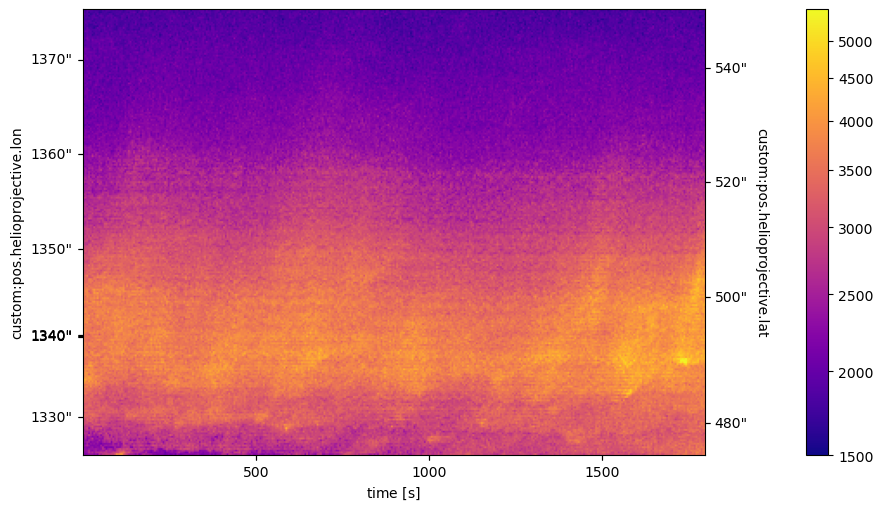

In [19]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
slit_1_spacetime_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)))
plt.colorbar()

In [20]:
slit_1_spacetime_wcs_new = (SkyCoordTableCoordinate(slit_1_pixels_0_new,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_1_spacetime_cube_new = NDCube(slit_1_intensity_new,slit_1_spacetime_wcs_new)

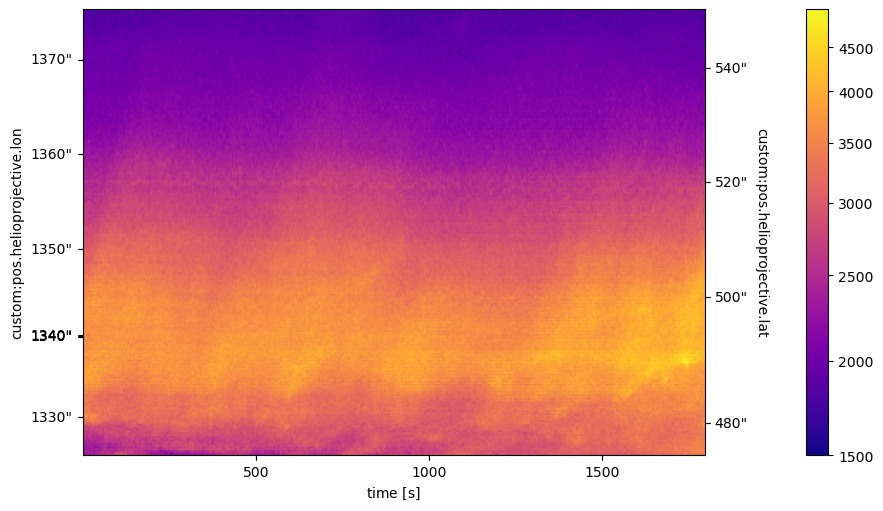

In [21]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
slit_1_spacetime_cube_new.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)))
plt.colorbar()

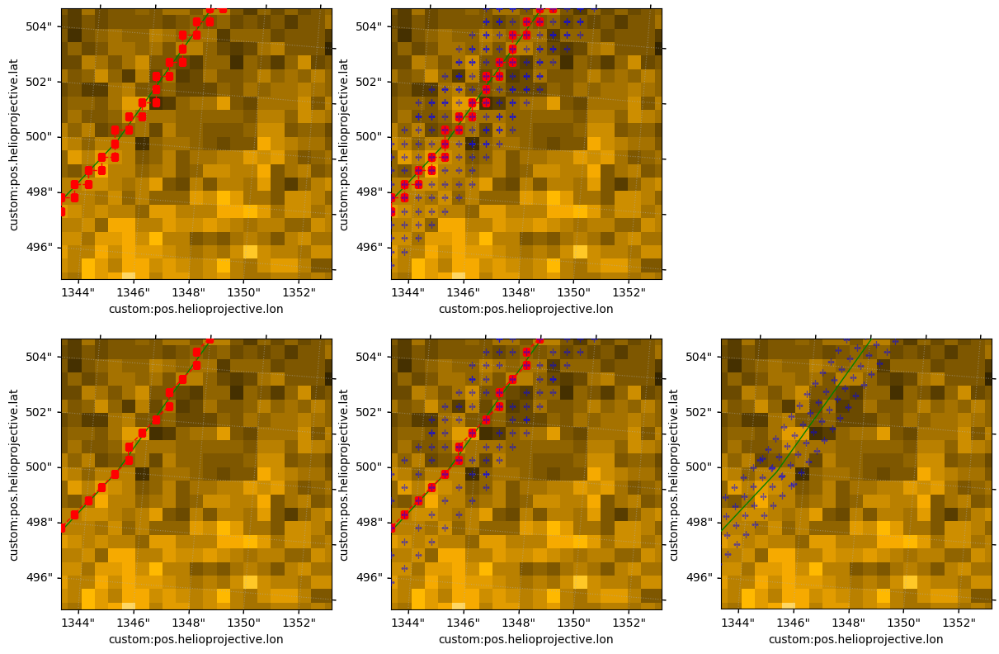

In [141]:
fig = plt.figure(figsize=(12,8),layout='constrained')

ax1 = fig.add_subplot(231,projection=eui_map_wcs_all)
ax2 = fig.add_subplot(232,projection=eui_map_wcs_all)
ax3 = fig.add_subplot(234,projection=eui_map_wcs_all)
ax4 = fig.add_subplot(235,projection=eui_map_wcs_all)
ax5 = fig.add_subplot(236,projection=eui_map_wcs_all)
# eui_map_0_shift.plot_settings['norm'] = ImageNormalize(stretch=AsinhStretch(0.1))
# eui_map_0_shift.plot(axes=ax)

for ax_ in (ax1,ax2,ax3,ax4,ax5):
    ax_.imshow(eui_map_181_shift.data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(vmin=2.5e3,vmax=4.5e3,stretch=LinearStretch()),
            interpolation="none")

    ax_.plot_coord(slit_1_coords, color="green", lw=1, ls="-")
    # ax.plot_coord(slit_2_coords, color="red", lw=0.5, ls="-")

    ax_.set_xlim(1790,1810)
    ax_.set_ylim(645,665)

    ax_.grid("on",ls=":",alpha=0.5)

ax1.plot_coord(slit_1_pixels_0, color="red", lw=1, ls="--",marker="s")
ax2.plot_coord(slit_1_pixels_0_new, color="red", lw=1, ls="--",marker="s")
ax3.plot_coord(slit_1_pixels_0_bresenham, color="red", lw=1, ls="--",marker="s")
ax4.plot_coord(slit_1_pixels_0_new_bresenham, color="red", lw=1, ls="--",marker="s")
ax5.plot_coord(slit_1_pixels_0_skimage_profile_all, lw=0,marker="+",alpha=0.5,color="blue")
for coords in slit_1_pixels_0_new_all:
    ax2.plot_coord(coords, color="blue", lw=0,marker="+",alpha=0.5)
for coords in slit_1_pixels_0_new_all_bresenham:
    ax4.plot_coord(coords, color="blue", lw=0,marker="+",alpha=0.5)

In [69]:
slit_1_spacetime_distance_wcs = (QuantityTableCoordinate(slit_1_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

In [70]:
slit_1_spacetime_distance_cube = NDCube(slit_1_intensity,slit_1_spacetime_distance_wcs)

0.1 Mm / s


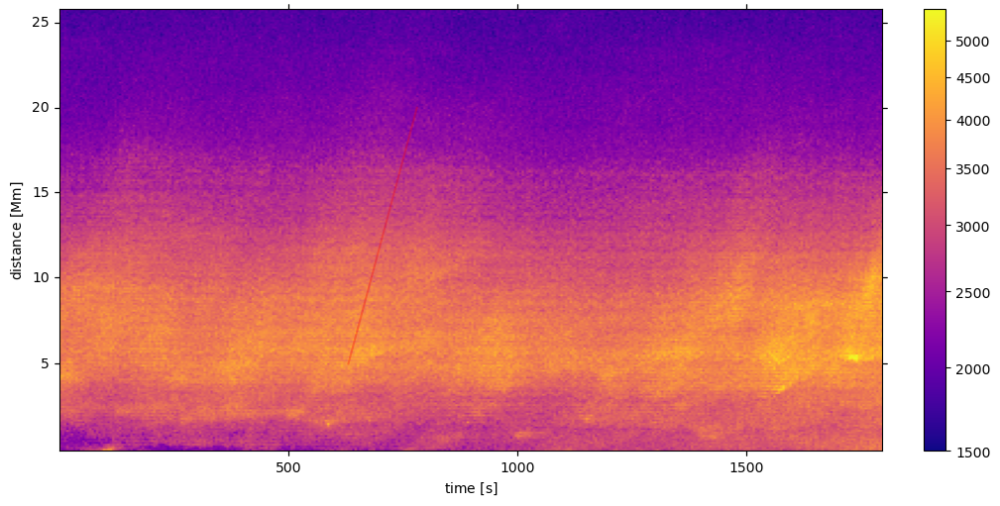

In [71]:
# this is the projected velocity 
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_1_spacetime_distance_cube.wcs)
slit_1_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)),
                                    aspect="auto")

plt.colorbar()

slit_1_spacetime_distance_slope_1_x = [630,780]*u.s
slit_1_spacetime_distance_slope_1_y = [5,20]*u.Mm
slit_1_spacetime_distance_slope_1_vel = (slit_1_spacetime_distance_slope_1_y[1] - slit_1_spacetime_distance_slope_1_y[0])/ \
    (slit_1_spacetime_distance_slope_1_x[1] - slit_1_spacetime_distance_slope_1_x[0])
slit_1_spacetime_distance_slope_1_x_pixel = slit_1_spacetime_distance_cube.wcs.world_to_pixel(slit_1_spacetime_distance_slope_1_y,slit_1_spacetime_distance_slope_1_x)
ax.plot_coord(slit_1_spacetime_distance_slope_1_x_pixel[1],slit_1_spacetime_distance_slope_1_x_pixel[0],color="red",alpha=0.3,)
print(slit_1_spacetime_distance_slope_1_vel)

# ax.set_xlim(100,200)

In [72]:
slit_1_spacetime_distance_wcs_new = (QuantityTableCoordinate(slit_1_pixels_0_distance_new.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_1_spacetime_distance_cube_new = NDCube(slit_1_intensity_new,slit_1_spacetime_distance_wcs_new)

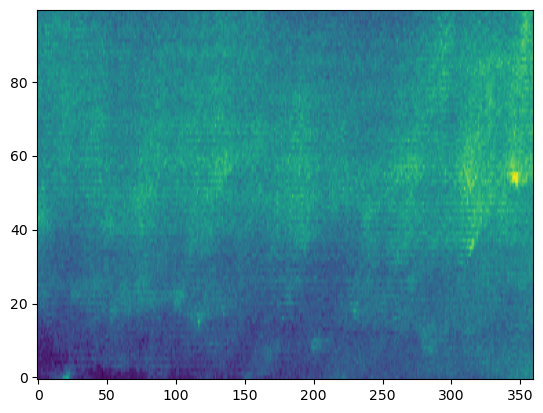

In [73]:
plt.imshow(slit_1_spacetime_distance_cube.data[:,0:100].T,origin="lower",aspect="auto")

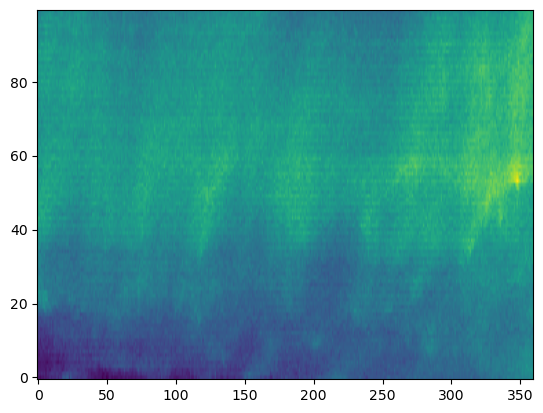

In [75]:
plt.imshow(slit_1_spacetime_distance_cube_new.data[:,0:100].T,origin="lower",aspect="auto")

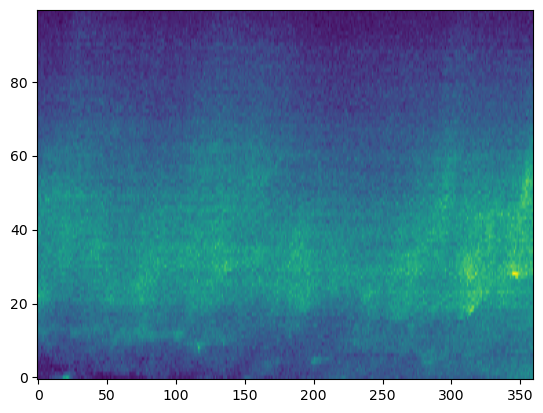

In [76]:
plt.imshow(slit_1_intensity_bresenham[:,0:100].value.T,origin="lower",aspect="auto")

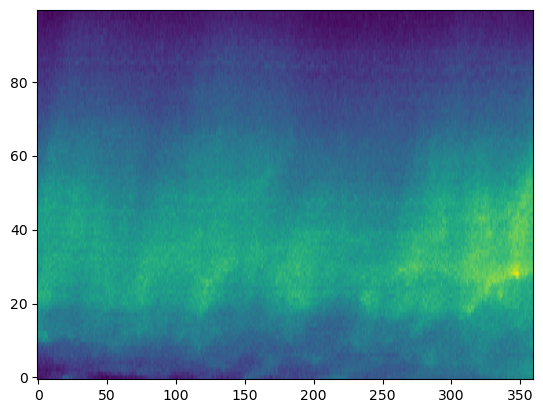

In [77]:
plt.imshow(slit_1_intensity_new_bresenham[:,0:100].value.T,origin="lower",aspect="auto")

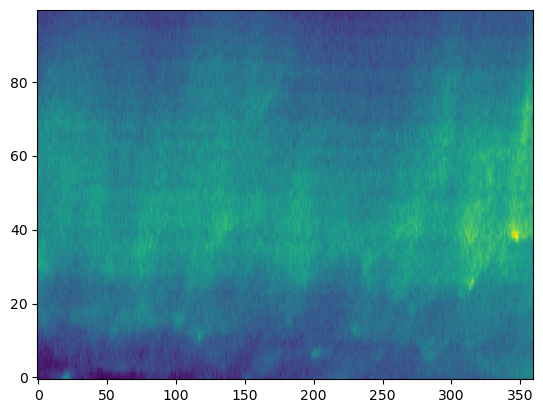

In [98]:
plt.imshow(slit_1_intensity_skimage_profile[:,0:100].value.T,origin="lower",aspect="auto")

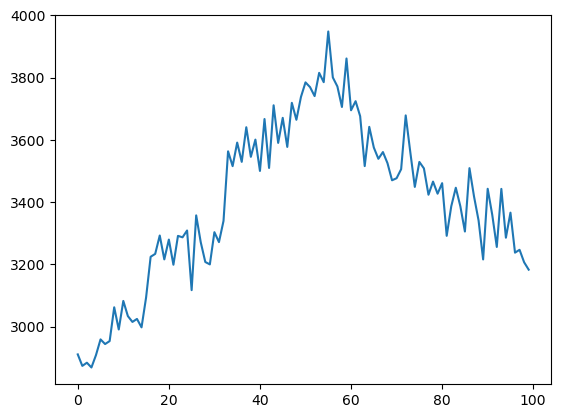

In [81]:
plt.plot(slit_1_spacetime_distance_cube_new.data[250,0:100])

0.1 Mm / s


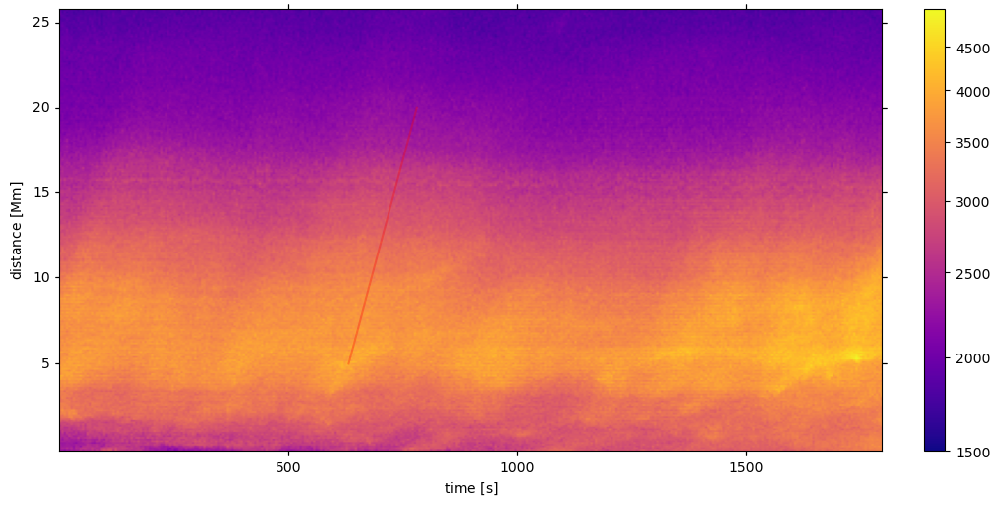

In [26]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_1_spacetime_distance_cube_new.wcs)
slit_1_spacetime_distance_cube_new.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)),
                                    aspect="auto")
plt.colorbar()

ax.plot_coord(slit_1_spacetime_distance_slope_1_x_pixel[1],slit_1_spacetime_distance_slope_1_x_pixel[0],color="red",alpha=0.3,)
print(slit_1_spacetime_distance_slope_1_vel)


In [27]:
slit_1_spacetime_distance_cube_new_base_diff = NDCube(slit_1_intensity_new - np.nanmean(slit_1_intensity_new,axis=0)[np.newaxis,:],slit_1_spacetime_distance_wcs_new)

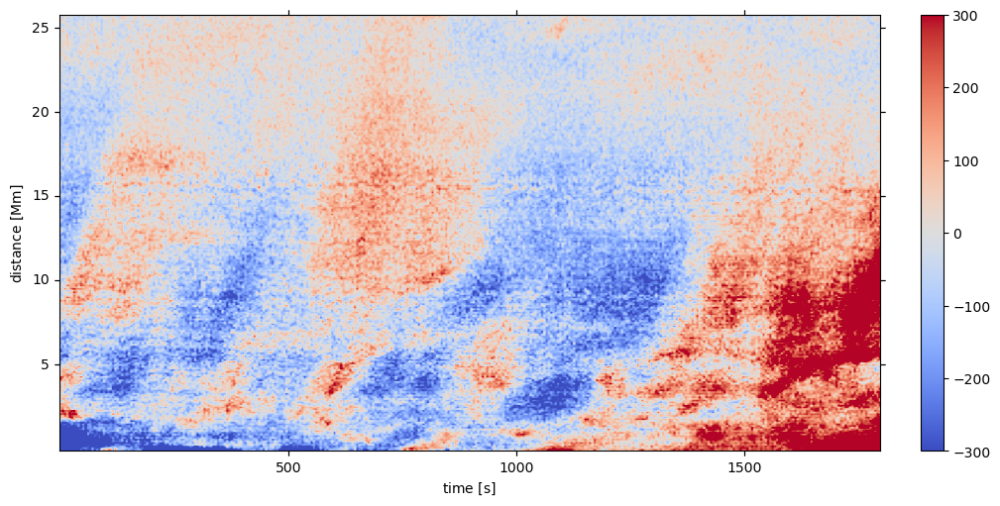

In [28]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_1_spacetime_distance_cube_new_base_diff.wcs)
slit_1_spacetime_distance_cube_new_base_diff.plot(axes = ax, plot_axes=('x','y'),cmap='coolwarm',norm=ImageNormalize(vmin=-300,vmax=300),
                                    aspect="auto")
plt.colorbar()



In [29]:
slit_2_pixels_0, slit_2_pixels_0_distance, slit_2_pixels_0_all,  slit_2_intensity = get_intensity_spacetime_cut_new(slit_2_coords,eui_map_seq_coalign,thick=3)

In [30]:
slit_2_spacetime_wcs = (SkyCoordTableCoordinate(slit_2_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_2_spacetime_cube = NDCube(slit_2_intensity,slit_2_spacetime_wcs)

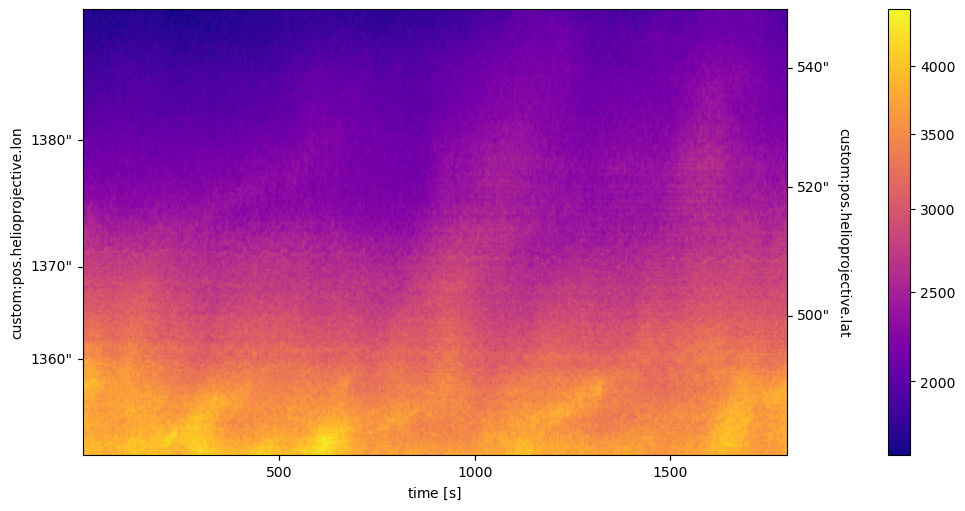

In [31]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
slit_2_spacetime_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1600,stretch=AsinhStretch(0.8)))
plt.colorbar()

In [32]:
slit_2_spacetime_distance_wcs = (QuantityTableCoordinate(slit_2_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_2_spacetime_distance_cube = NDCube(slit_2_intensity,slit_2_spacetime_distance_wcs)

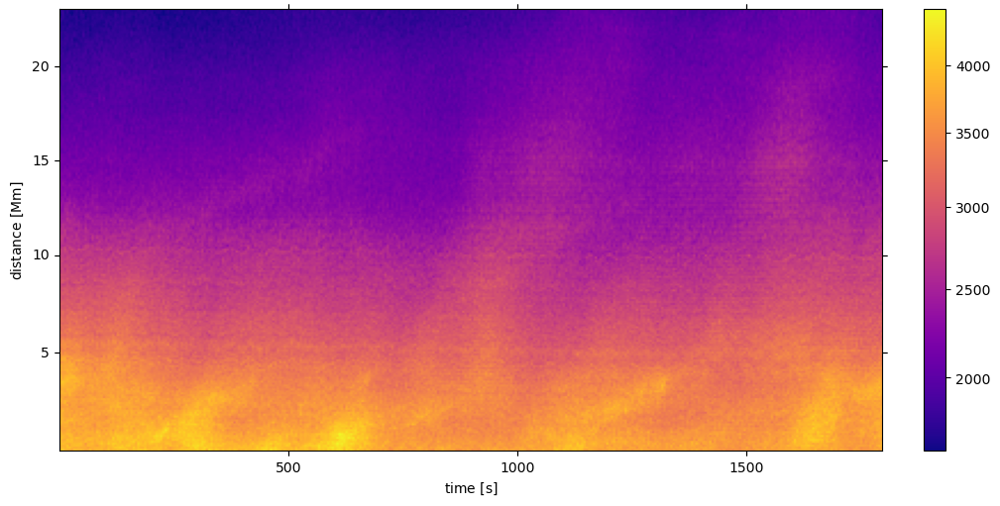

In [33]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_2_spacetime_distance_cube.wcs)
slit_2_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1600,stretch=AsinhStretch(0.8)),
                                    aspect="auto")
plt.colorbar()

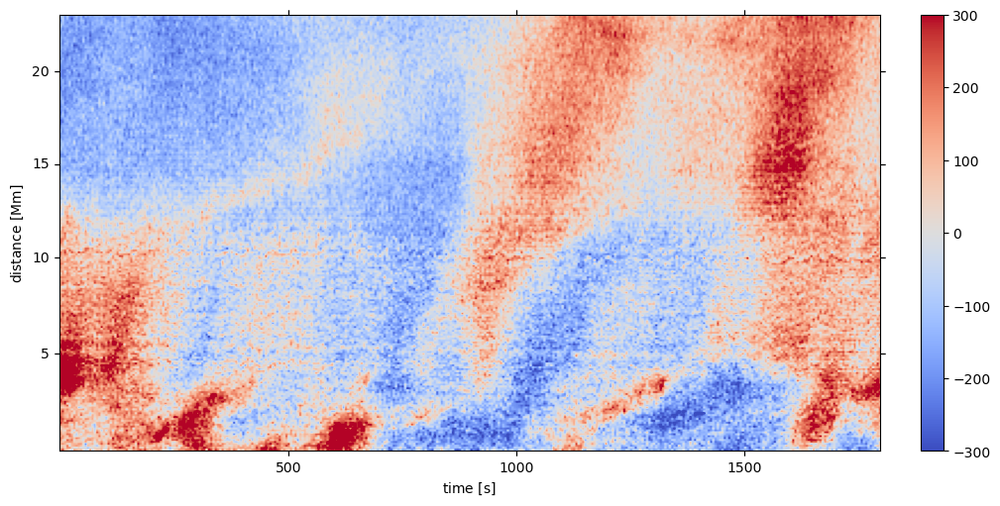

In [34]:
slit_2_spacetime_distance_cube_base_diff = NDCube(slit_2_intensity - np.nanmean(slit_2_intensity,axis=0)[np.newaxis,:],slit_2_spacetime_distance_wcs)
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_2_spacetime_distance_cube_base_diff.wcs)
slit_2_spacetime_distance_cube_base_diff.plot(axes = ax, plot_axes=('x','y'),cmap='coolwarm',norm=ImageNormalize(vmin=-300,vmax=300),
                                    aspect="auto")
plt.colorbar()

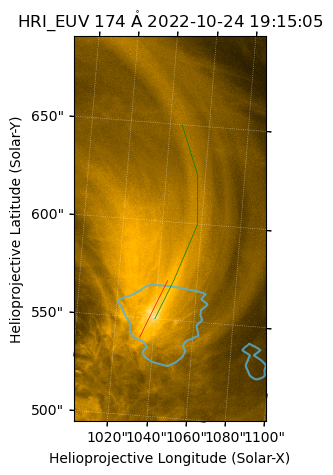

In [35]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
eui_map_181_shift.plot_settings['norm'] = ImageNormalize(stretch=AsinhStretch(0.1))
eui_map_181_shift.plot(axes=ax)

bounds = ax.axis()
eis_hhflare_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(1100,1300)
ax.set_ylim(700,1100)

slit_3_coords = SkyCoord([1040,1048,1058,1056,1046]*u.arcsec,
                         [550,570,600,625,650]*u.arcsec,
                         frame=eui_map_181_shift.coordinate_frame)

slit_3a_coords = SkyCoord([1033,1045]*u.arcsec,
                        [540,570]*u.arcsec,
                        frame=eui_map_181_shift.coordinate_frame)


ax.plot_coord(slit_3_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_3a_coords, color="red", lw=0.5, ls="-")

In [36]:
slit_3_pixels_0,slit_3_pixels_0_distance, slit_3_pixels_0_all, slit_3_intensity = get_intensity_spacetime_cut_new(slit_3_coords,eui_map_seq_coalign)

slit_3_spacetime_wcs = (SkyCoordTableCoordinate(slit_3_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

In [37]:
slit_3_spacetime_cube = NDCube(slit_3_intensity,slit_3_spacetime_wcs)

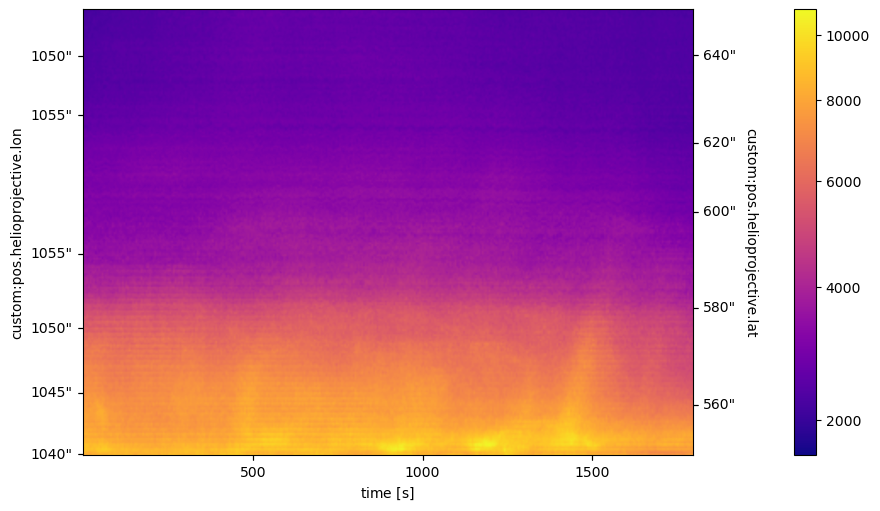

In [38]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

slit_3_spacetime_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)),
                           interpolation = 'gaussian')
plt.colorbar()

In [39]:
slit_3_spacetime_distance_wcs = (QuantityTableCoordinate(slit_3_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_3_spacetime_distance_cube = NDCube(slit_3_intensity,slit_3_spacetime_distance_wcs)

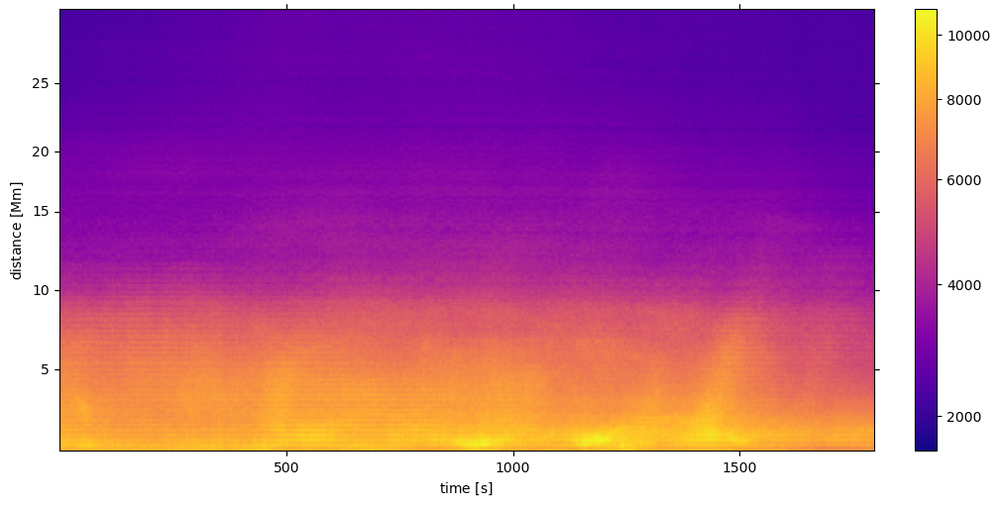

In [40]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_3_spacetime_distance_cube.wcs)
slit_3_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)),
                                    aspect="auto")

plt.colorbar()

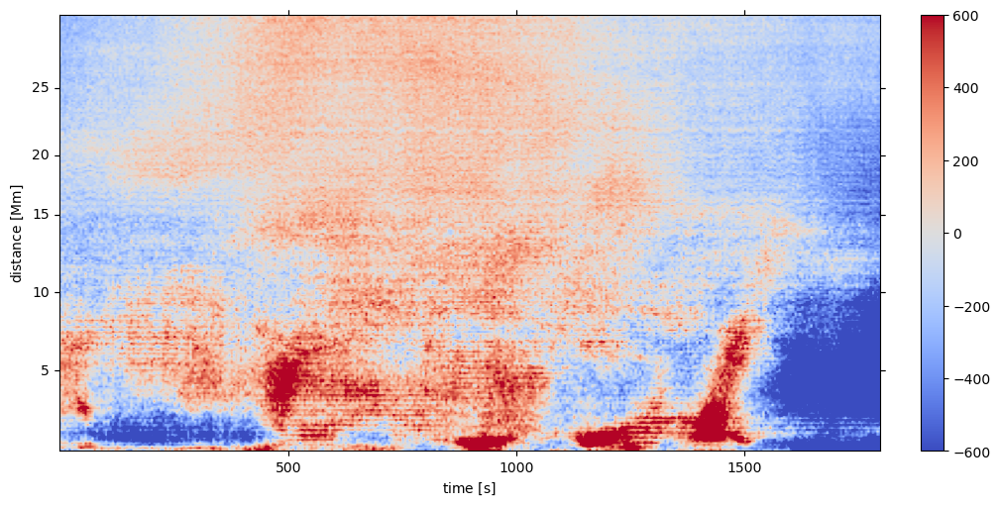

In [41]:
slit_3_spacetime_distance_cube_base_diff = NDCube(slit_3_intensity - np.nanmean(slit_3_intensity,axis=0)[np.newaxis,:],slit_3_spacetime_distance_wcs)
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_3_spacetime_distance_cube_base_diff.wcs)
slit_3_spacetime_distance_cube_base_diff.plot(axes = ax, plot_axes=('x','y'),cmap='coolwarm',norm=ImageNormalize(vmin=-600,vmax=600),
                                    aspect="auto")
plt.colorbar()

In [42]:
slit_3a_pixels_0,slit_3a_pixels_0_distance, slit_3a_pixels_0_all, slit_3a_intensity = \
    get_intensity_spacetime_cut_new(slit_3a_coords,eui_map_seq_coalign,thick=3)

slit_3a_spacetime_wcs = (SkyCoordTableCoordinate(slit_3a_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_3a_spacetime_cube = NDCube(slit_3a_intensity,slit_3a_spacetime_wcs)

slit_3a_spacetime_distance_wcs = (QuantityTableCoordinate(slit_3a_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_3a_spacetime_distance_cube = NDCube(slit_3a_intensity,slit_3a_spacetime_distance_wcs)


<WCSAxes: >

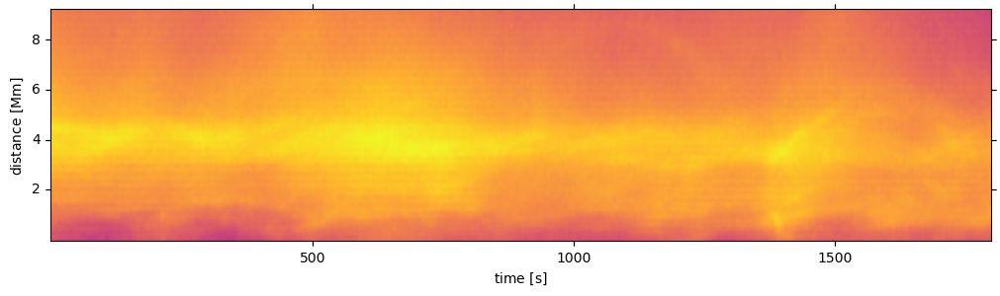

In [43]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

slit_3a_spacetime_distance_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.4)),
                            interpolation = 'gaussian')

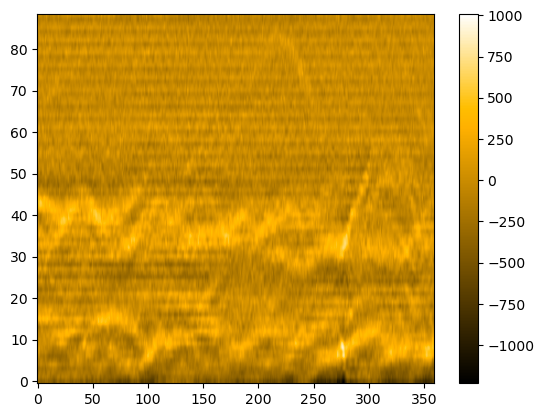

In [44]:
slit_3a_intensity_box_car = cv2.GaussianBlur(slit_3a_intensity,(15,1),5,0)
plt.imshow((slit_3a_intensity - slit_3a_intensity_box_car).T,aspect="auto",cmap="sdoaia171",origin="lower",
            interpolation="gaussian",)
plt.colorbar()

In [43]:
eui_map_region_east = eui_map_181_shift.submap([300,300]*u.pix,top_right=[800,800]*u.pix)
eui_map_region_west = eui_map_181_shift.submap([1500,500]*u.pix,top_right=[2048,1000]*u.pix)
eui_map_region_center = eui_map_181_shift.submap([1050,700]*u.pix,top_right=[1350,1100]*u.pix)

In [44]:
def get_map_edge_coords(map):
    map_edges = sunpy.map.map_edges(map)

    x_pix = []
    y_pix = []

    for ii in range(map_edges[1].shape[0]):
        x_pix.append(map_edges[1][ii,0].value)
        y_pix.append(map_edges[1][ii,1].value)

    for ii in range(map_edges[3].shape[0]):
        x_pix.append(map_edges[3][ii,0].value)
        y_pix.append(map_edges[3][ii,1].value)

    for ii in range(map_edges[0].shape[0]-1,-1,-1):
        x_pix.append(map_edges[0][ii,0].value)
        y_pix.append(map_edges[0][ii,1].value)

    for ii in range(map_edges[2].shape[0]-1,-1,-1):
        x_pix.append(map_edges[2][ii,0].value)
        y_pix.append(map_edges[2][ii,1].value)
    
    return map.pixel_to_world(x_pix*u.pix,y_pix*u.pix)

In [45]:
def add_connection_lines(ax1,ax2,xA,yA,xB,yB,color="black"):
    con1 = patches.ConnectionPatch(xyA=(xA,yA), xyB=(xB,yB),
                      coordsA="data", coordsB="data",axesA=ax1, axesB=ax2, color="red")
    ax1.add_artist(con1)

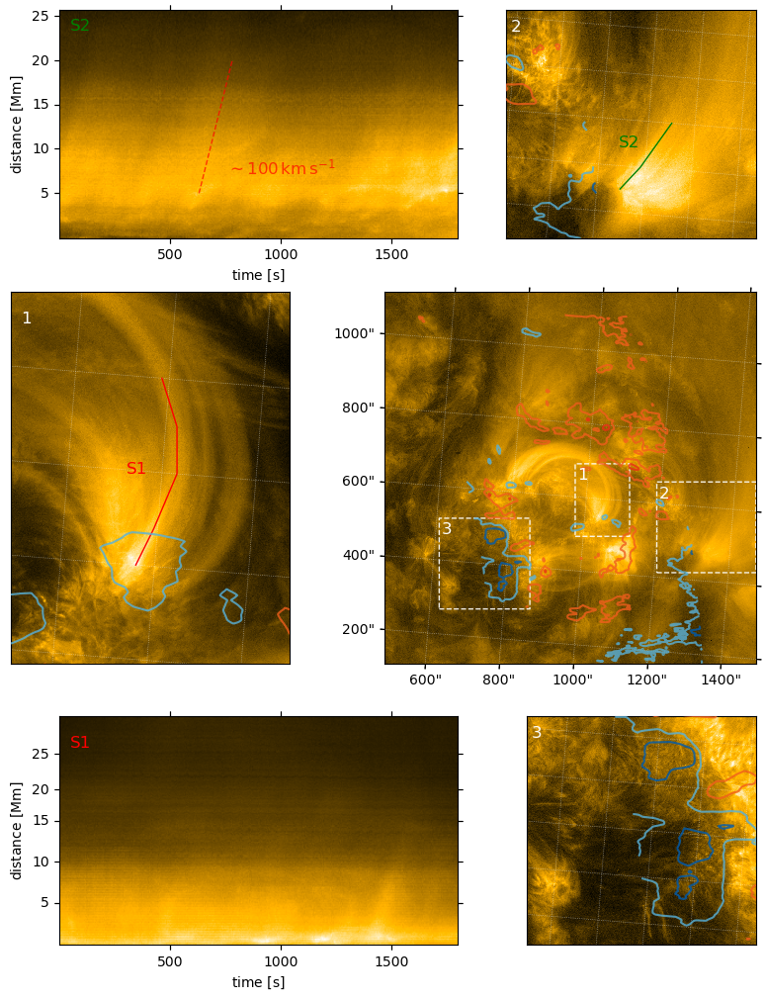

In [80]:
fig = plt.figure(figsize=(8,10),constrained_layout=True)

gs = fig.add_gridspec(nrows=4, ncols=1, left=0, right=1.0,
                      hspace=0.0, wspace=0.0,height_ratios=[2,1.5,1.5,2])

gs0 = gs[0].subgridspec(1, 20, wspace=0.0)
gs1 = gs[1:3].subgridspec(1, 20, wspace=0.0)
gs2 = gs[3].subgridspec(1, 20, wspace=0.0)

axes = {"2st":fig.add_subplot(gs0[1:12],projection=slit_1_spacetime_distance_cube.wcs),
        "2":fig.add_subplot(gs0[12:],projection=eui_map_region_west,),
        "1":fig.add_subplot(gs1[1:9],projection=eui_map_region_center,),
        "main":fig.add_subplot(gs1[9:],projection=eui_map_181_shift),
        "1st":fig.add_subplot(gs2[1:12],projection=slit_3_spacetime_distance_cube.wcs),
        "3":fig.add_subplot(gs2[12:],projection=eui_map_region_east,)}
        



eui_map_181_shift.plot(axes=axes["main"],title=None,
                    norm=ImageNormalize(stretch=AsinhStretch(0.01)))
eui_map_region_west.plot(axes=axes["2"],title=None)
eui_map_region_center.plot(axes=axes["1"],title=None)
eui_map_region_east.plot(axes=axes["3"],title=None)

slit_1_spacetime_distance_cube_new.plot(axes = axes["2st"], plot_axes=('x','y'),
                                    cmap='solar orbiterhri_euv174',
                                    norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.7)),
                                    aspect="auto")

axes["2st"].plot_coord(slit_1_spacetime_distance_slope_1_x_pixel[1],slit_1_spacetime_distance_slope_1_x_pixel[0],color="red",alpha=0.7,ls="--",lw=1)
axes["2st"].text(200,80,r"$\sim 100\,{\rm km\,s^{-1}}$",fontsize=12,alpha=0.7,
                 va="center",ha="center",color="red")


slit_3_spacetime_distance_cube.plot(axes = axes["1st"], plot_axes=('x','y'),
                                    cmap='solar orbiterhri_euv174',
                                    norm=ImageNormalize(vmin=1500,stretch=AsinhStretch(0.7)),
                                    aspect="auto")

# eui_map_region_west.draw_quadrangle(eui_map_region_west.bottom_left_coord,
#                                          top_right=eui_map_region_west.top_right_coord,
#                                          axes=axes["main"],color="white",lw=1,ls="--",alpha=0.5)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_west),color="w",lw=1,ls="--",alpha=0.9)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_east),color="w",lw=1,ls="--",alpha=0.9)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_center),color="w",lw=1,ls="--",alpha=0.9)

axes["main"].text(1060,1080,"1",color="white",fontsize=12,ha="left",va="top")
axes["main"].text(310,780,"3",color="white",fontsize=12,ha="left",va="top")
axes["main"].text(1510,980,"2",color="white",fontsize=12,ha="left",va="top")

axes["2"].text(10,480,"2",color="white",fontsize=12,ha="left",va="top")
axes["2"].text(270,210,"S2",color="green",fontsize=12,ha="center",va="center")
axes["2st"].text(10,248,"S2",color="green",fontsize=12,ha="left",va="top")

axes["3"].text(10,480,"3",color="white",fontsize=12,ha="left",va="top")

axes["1"].text(10,380,"1",color="white",fontsize=12,ha="left",va="top")
axes["1"].text(135,210,"S1",color="red",fontsize=12,ha="center",va="center")
axes["1st"].text(10,240,"S1",color="red",fontsize=12,ha="left",va="top")


axes["2"].plot_coord(slit_1_coords, color="green", lw=1, ls="-")
axes["1"].plot_coord(slit_3_coords, color="red", lw=1, ls="-")

for ax_str in ("1","2","3","main"):
    axes[ax_str].set_anchor('E')
    axes[ax_str].set_ylabel(" ")
    axes[ax_str].set_xlabel(" ")


for ax_str in ("2","3","main"):
    bounds = axes[ax_str].axis()
    eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,axes=axes[ax_str])
    axes[ax_str].axis(bounds)

bounds = axes["1"].axis()
eis_hhflare_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,axes=axes["1"])
axes["1"].axis(bounds)

for ax_str in ("2st","1st"):
    axes[ax_str].set_anchor('W')

for ax_str in ("1","2","3"):
    axes[ax_str].tick_params(axis="x",bottom=False, top=False, left=False, right=False,
                             labelbottom=False, labeltop=False, labelleft=False, labelright=False)
    axes[ax_str].tick_params(axis="y",bottom=False, top=False, left=False, right=False,
                             labelbottom=False, labeltop=False, labelleft=False, labelright=False)

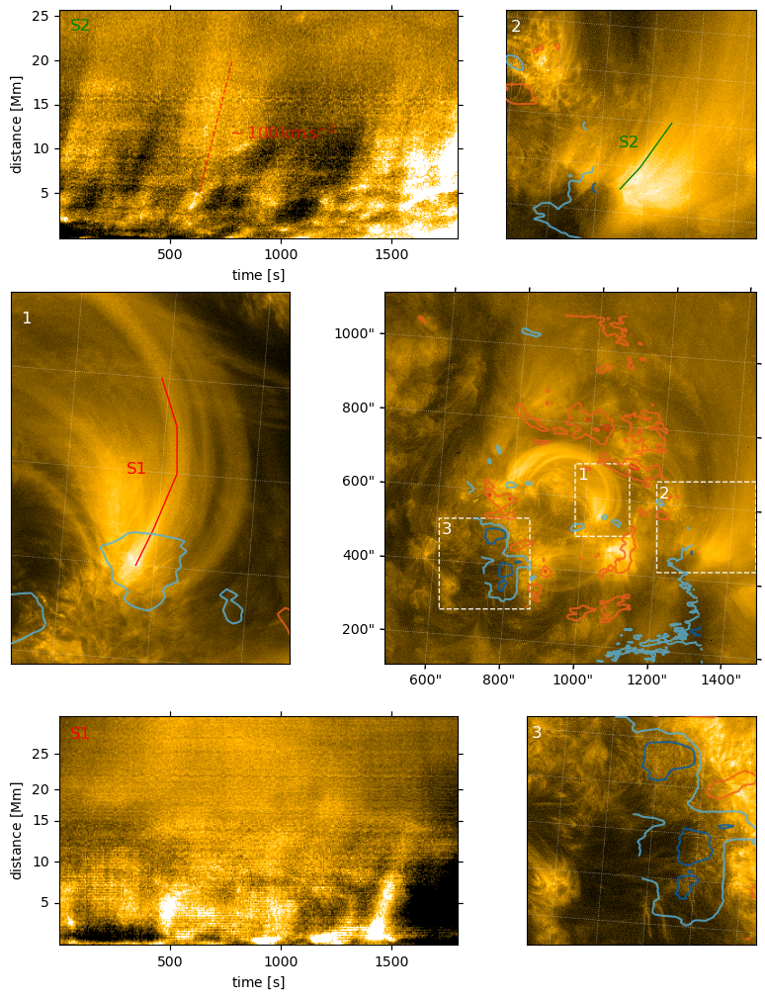

In [83]:
fig = plt.figure(figsize=(8,10),constrained_layout=True)

gs = fig.add_gridspec(nrows=4, ncols=1, left=0, right=1.0,
                      hspace=0.0, wspace=0.0,height_ratios=[2,1.5,1.5,2])

gs0 = gs[0].subgridspec(1, 20, wspace=0.0)
gs1 = gs[1:3].subgridspec(1, 20, wspace=0.0)
gs2 = gs[3].subgridspec(1, 20, wspace=0.0)

axes = {"2st":fig.add_subplot(gs0[1:12],projection=slit_1_spacetime_distance_cube.wcs),
        "2":fig.add_subplot(gs0[12:],projection=eui_map_region_west,),
        "1":fig.add_subplot(gs1[1:9],projection=eui_map_region_center,),
        "main":fig.add_subplot(gs1[9:],projection=eui_map_181_shift),
        "1st":fig.add_subplot(gs2[1:12],projection=slit_3_spacetime_distance_cube.wcs),
        "3":fig.add_subplot(gs2[12:],projection=eui_map_region_east,)}
        



eui_map_181_shift.plot(axes=axes["main"],title=None,norm=ImageNormalize(stretch=AsinhStretch(0.01)))
eui_map_region_west.plot(axes=axes["2"],title=None)
eui_map_region_center.plot(axes=axes["1"],title=None)
eui_map_region_east.plot(axes=axes["3"],title=None)

slit_1_spacetime_distance_cube_new_base_diff.plot(axes = axes["2st"], plot_axes=('x','y'),
                                    cmap='sdoaia171',
                                    norm=ImageNormalize(vmin=-300,vmax=300),
                                    aspect="auto")

axes["2st"].plot_coord(slit_1_spacetime_distance_slope_1_x_pixel[1],slit_1_spacetime_distance_slope_1_x_pixel[0],color="red",alpha=0.7,ls="--",lw=1)
axes["2st"].text(200,120,r"$\sim 100\,{\rm km\,s^{-1}}$",fontsize=12,alpha=0.7,
                 va="center",ha="center",color="red")


slit_3_spacetime_distance_cube_base_diff.plot(axes = axes["1st"], plot_axes=('x','y'),
                                    cmap='sdoaia171',
                                    norm=ImageNormalize(vmin=-600,vmax=600),
                                    aspect="auto")

# eui_map_region_west.draw_quadrangle(eui_map_region_west.bottom_left_coord,
#                                          top_right=eui_map_region_west.top_right_coord,
#                                          axes=axes["main"],color="white",lw=1,ls="--",alpha=0.5)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_west),color="w",lw=1,ls="--",alpha=0.9)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_east),color="w",lw=1,ls="--",alpha=0.9)
axes["main"].plot_coord(get_map_edge_coords(eui_map_region_center),color="w",lw=1,ls="--",alpha=0.9)

axes["main"].text(1060,1080,"1",color="white",fontsize=12,ha="left",va="top")
axes["main"].text(310,780,"3",color="white",fontsize=12,ha="left",va="top")
axes["main"].text(1510,980,"2",color="white",fontsize=12,ha="left",va="top")

axes["2"].text(10,480,"2",color="white",fontsize=12,ha="left",va="top")
axes["2"].text(270,210,"S2",color="green",fontsize=12,ha="center",va="center")
axes["2st"].text(10,248,"S2",color="green",fontsize=12,ha="left",va="top")

axes["3"].text(10,480,"3",color="white",fontsize=12,ha="left",va="top")

axes["1"].text(10,380,"1",color="white",fontsize=12,ha="left",va="top")
axes["1"].text(135,210,"S1",color="red",fontsize=12,ha="center",va="center")
axes["1st"].text(10,250,"S1",color="red",fontsize=12,ha="left",va="top")


axes["2"].plot_coord(slit_1_coords, color="green", lw=1, ls="-")
axes["1"].plot_coord(slit_3_coords, color="red", lw=1, ls="-")

for ax_str in ("1","2","3","main"):
    axes[ax_str].set_anchor('E')
    axes[ax_str].set_ylabel(" ")
    axes[ax_str].set_xlabel(" ")


for ax_str in ("2","3","main"):
    bounds = axes[ax_str].axis()
    eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,axes=axes[ax_str])
    axes[ax_str].axis(bounds)

bounds = axes["1"].axis()
eis_hhflare_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,axes=axes["1"])
axes["1"].axis(bounds)

for ax_str in ("2st","1st"):
    axes[ax_str].set_anchor('W')

for ax_str in ("1","2","3"):
    axes[ax_str].tick_params(axis="x",bottom=False, top=False, left=False, right=False,
                             labelbottom=False, labeltop=False, labelleft=False, labelright=False)
    axes[ax_str].tick_params(axis="y",bottom=False, top=False, left=False, right=False,
                             labelbottom=False, labeltop=False, labelleft=False, labelright=False)

plt.savefig(fname="../../figs/test_figs/eui_space_time_base_diff.pdf",dpi=300,bbox_inches="tight")
plt.savefig(fname="../../figs/test_figs/eui_space_time_base_diff.png",dpi=300,bbox_inches="tight")

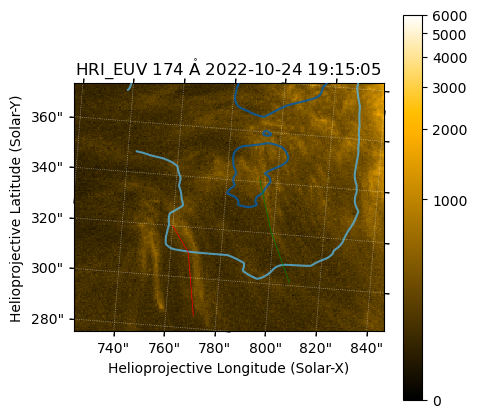

In [210]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
eui_map_181_shift.plot_settings['norm'] = ImageNormalize(vmin=0,vmax=6e3,stretch=AsinhStretch(0.05))
eui_map_181_shift.plot(axes=ax)
plt.colorbar()

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(500,750)
ax.set_ylim(300,500)

slit_4_coords = SkyCoord([793,799,808]*u.arcsec,
                         [341,321,301]*u.arcsec,
                         frame=eui_map_181_shift.coordinate_frame)

slit_5_coords = SkyCoord([760,767,771]*u.arcsec,
                            [320,310,285]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

ax.plot_coord(slit_4_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_5_coords, color="red", lw=0.5, ls="-")

In [211]:
slit_4_pixels_0, slit_4_pixels_0_distance, slit_4_pixels_0_all, slit_4_intensity = get_intensity_spacetime_cut_new(slit_4_coords,eui_map_seq_coalign)

slit_4_spacetime_wcs = (SkyCoordTableCoordinate(slit_4_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

In [212]:
slit_4_spacetime_cube = NDCube(slit_4_intensity,slit_4_spacetime_wcs)

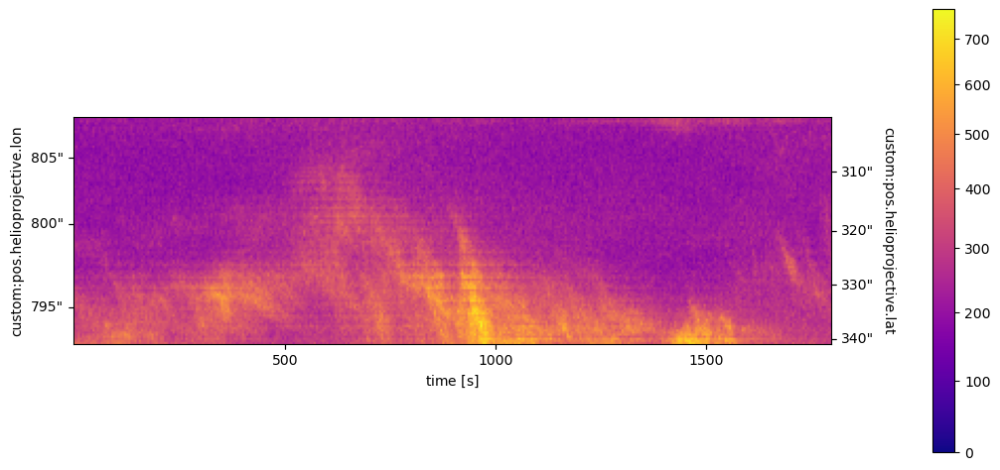

In [213]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

slit_4_spacetime_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=0,stretch=AsinhStretch(0.7)))
plt.colorbar()

In [214]:
slit_4_spacetime_distance_wcs = (QuantityTableCoordinate(slit_4_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_4_spacetime_distance_cube = NDCube(slit_4_intensity,slit_4_spacetime_distance_wcs)

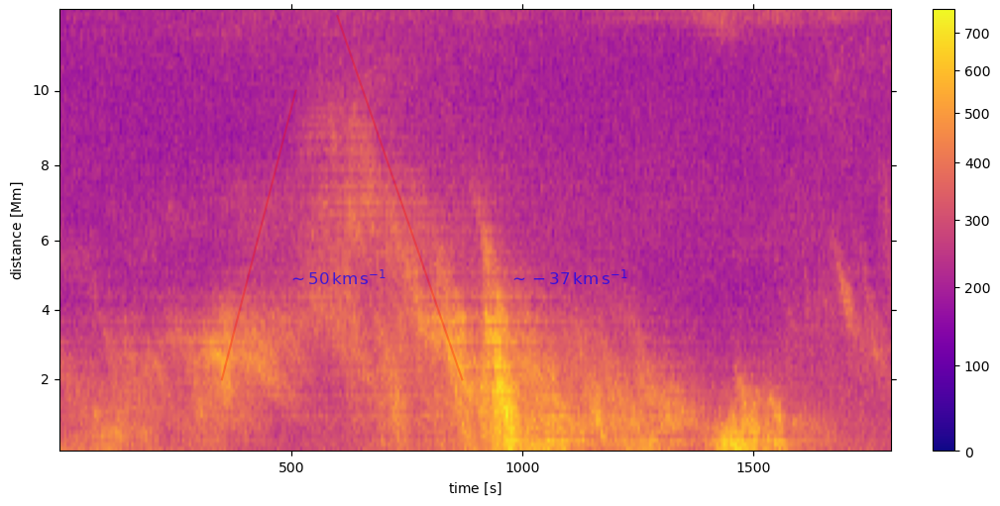

In [215]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_4_spacetime_distance_cube.wcs)
slit_4_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=0,stretch=AsinhStretch(0.4)),
                                    aspect="auto")

slit_4_spacetime_distance_slope_1_x = [350,510]*u.s
slit_4_spacetime_distance_slope_1_y = [2,10]*u.Mm
slit_4_spacetime_distance_slope_1_vel = (slit_4_spacetime_distance_slope_1_y[1] - slit_4_spacetime_distance_slope_1_y[0])/ \
    (slit_4_spacetime_distance_slope_1_x[1] - slit_4_spacetime_distance_slope_1_x[0])
slit_4_spacetime_distance_slope_1_x_pixel = slit_4_spacetime_distance_cube.wcs.world_to_pixel(slit_4_spacetime_distance_slope_1_y,slit_4_spacetime_distance_slope_1_x)
ax.plot_coord(slit_4_spacetime_distance_slope_1_x_pixel[1],slit_4_spacetime_distance_slope_1_x_pixel[0],color="red",alpha=0.3,)
ax.text(5,600,r"$\sim {:.0f}\,{{\rm km\,s^{{-1}}}}$".format(slit_4_spacetime_distance_slope_1_vel.to_value(u.km/u.s)),fontsize=12,alpha=0.7,
        transform=ax.get_transform("world"),va="center",ha="center",color="b")

slit_4_spacetime_distance_slope_2_x = [600,870]*u.s
slit_4_spacetime_distance_slope_2_y = [12,2]*u.Mm
slit_4_spacetime_distance_slope_2_vel = (slit_4_spacetime_distance_slope_2_y[1] - slit_4_spacetime_distance_slope_2_y[0])/ \
    (slit_4_spacetime_distance_slope_2_x[1] - slit_4_spacetime_distance_slope_2_x[0])
slit_4_spacetime_distance_slope_2_x_pixel = slit_4_spacetime_distance_cube.wcs.world_to_pixel(slit_4_spacetime_distance_slope_2_y,slit_4_spacetime_distance_slope_2_x)
ax.plot_coord(slit_4_spacetime_distance_slope_2_x_pixel[1],slit_4_spacetime_distance_slope_2_x_pixel[0],color="red",alpha=0.3,)
ax.text(5,1100,r"$\sim {:.0f}\,{{\rm km\,s^{{-1}}}}$".format(slit_4_spacetime_distance_slope_2_vel.to_value(u.km/u.s)),fontsize=12,alpha=0.7,
        transform=ax.get_transform("world"),va="center",ha="center",color="b")



plt.colorbar()

In [216]:
slit_5_pixels_0, slit_5_pixels_0_distance, slit_5_pixels_0_all, slit_5_intensity = get_intensity_spacetime_cut_new(slit_5_coords,eui_map_seq_coalign)

slit_5_spacetime_wcs = (SkyCoordTableCoordinate(slit_5_pixels_0,
                                                physical_types=("custom:pos.helioprojective.lon","custom:pos.helioprojective.lat"),) &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_5_spacetime_cube = NDCube(slit_5_intensity,slit_5_spacetime_wcs)

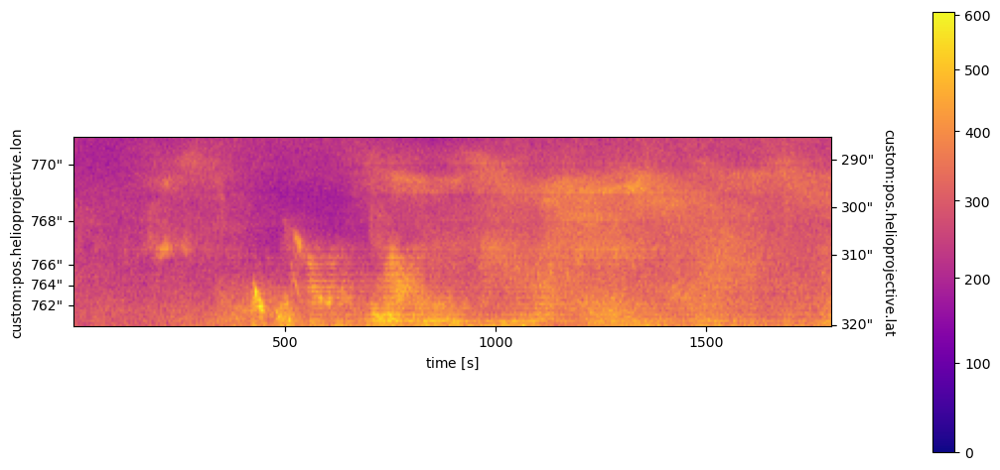

In [217]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

slit_5_spacetime_cube.plot(plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=0,stretch=AsinhStretch(0.7)))
plt.colorbar()

In [218]:
slit_5_spacetime_distance_wcs = (QuantityTableCoordinate(slit_5_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_5_spacetime_distance_cube = NDCube(slit_5_intensity,slit_5_spacetime_distance_wcs)

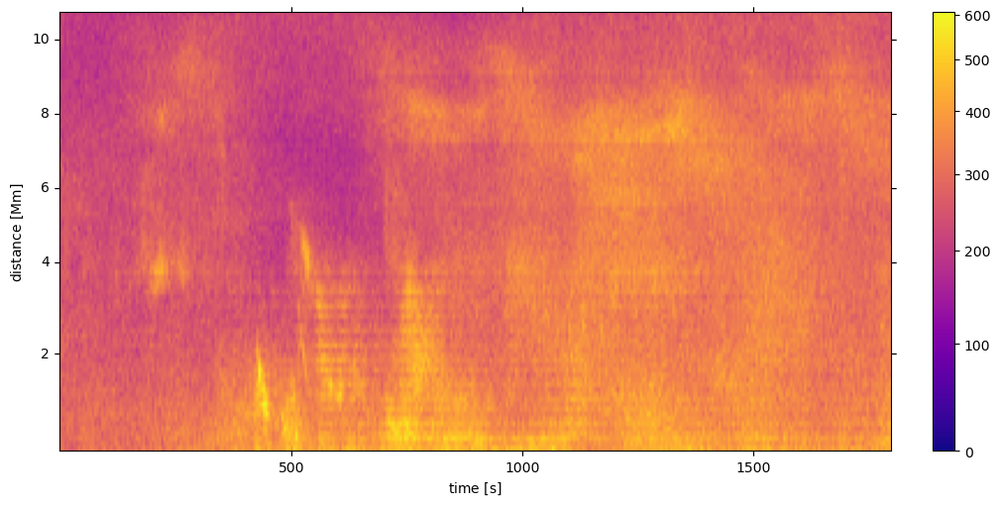

In [219]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_5_spacetime_distance_cube.wcs)
slit_5_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(vmin=0,stretch=AsinhStretch(0.4)),
                                    aspect="auto")
plt.colorbar()

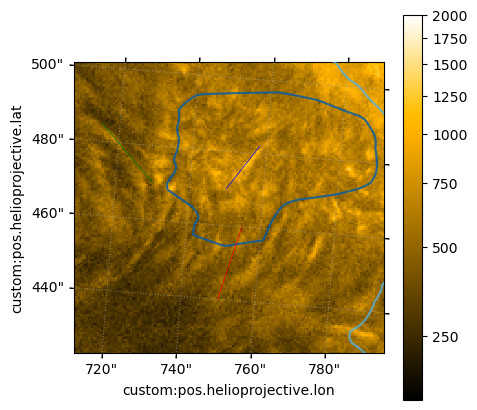

In [220]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
ax.imshow(eui_map_seq_coalign[12].data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(vmin=100,vmax=2e3,stretch=AsinhStretch(0.2)),
            interpolation="none")
plt.colorbar(ax.get_images()[0])

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(500,670)
ax.set_ylim(600,760)
ax.grid("on",ls=":",alpha=0.5)

slit_6_coords = SkyCoord([730,715]*u.arcsec,
                            [470,485]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

slit_7_coords = SkyCoord([755,750]*u.arcsec,
                            [460,440]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

slit_8_coords = SkyCoord([750,758]*u.arcsec,
                            [470,482]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

ax.plot_coord(slit_6_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_7_coords, color="red", lw=0.5, ls="-")
ax.plot_coord(slit_8_coords, color="blue", lw=0.5, ls="-")


In [221]:
slit_6_pixels_0, slit_6_pixels_0_distance, slit_6_pixels_0_all, slit_6_intensity = get_intensity_spacetime_cut_new(slit_6_coords,eui_map_seq_coalign,
                                                                                                                   thick=3)
slit_6_spacetime_distance_wcs = (QuantityTableCoordinate(slit_6_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_6_spacetime_distance_cube = NDCube(slit_6_intensity,slit_6_spacetime_distance_wcs)

<WCSAxes: >

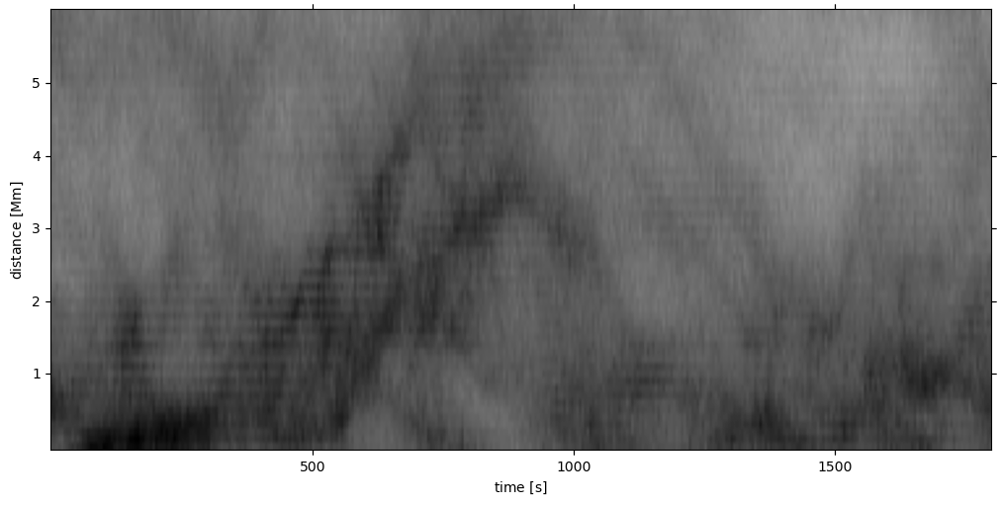

In [222]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_6_spacetime_distance_cube.wcs)
slit_6_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='Grays',norm=ImageNormalize(vmin=0,stretch=AsinhStretch(0.4)),
                                    aspect="auto")

In [226]:
slit_6_intensity_box_car = cv2.GaussianBlur(slit_6_intensity,(29,1),15,0)

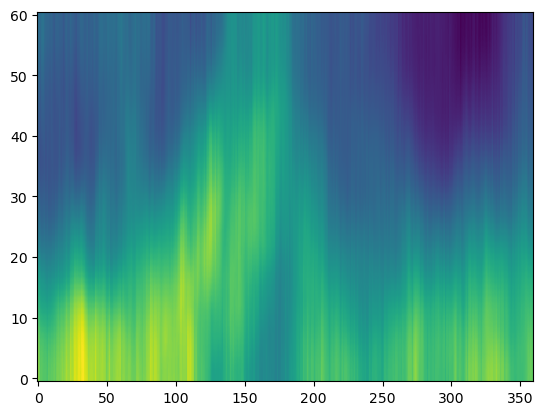

In [227]:
plt.imshow(slit_6_intensity_box_car.T,origin="lower",aspect="auto")

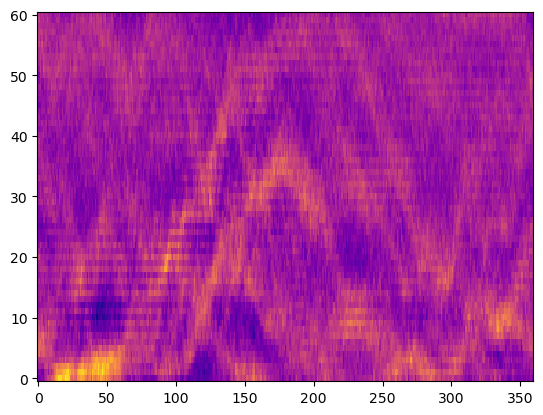

In [228]:
plt.imshow((slit_6_intensity - slit_6_intensity_box_car).T,origin="lower",aspect="auto",norm=ImageNormalize(),
           interpolation="none",cmap="plasma")

In [229]:
slit_6_intensity_box_car_cube = NDCube(slit_6_intensity - slit_6_intensity_box_car,slit_6_spacetime_distance_wcs)

In [231]:
eui_map_region_east_1 = eui_map_181_shift.submap([500,600]*u.pix,top_right=[670,760]*u.pix)

(-0.5, 170.5, -0.5, 160.5)

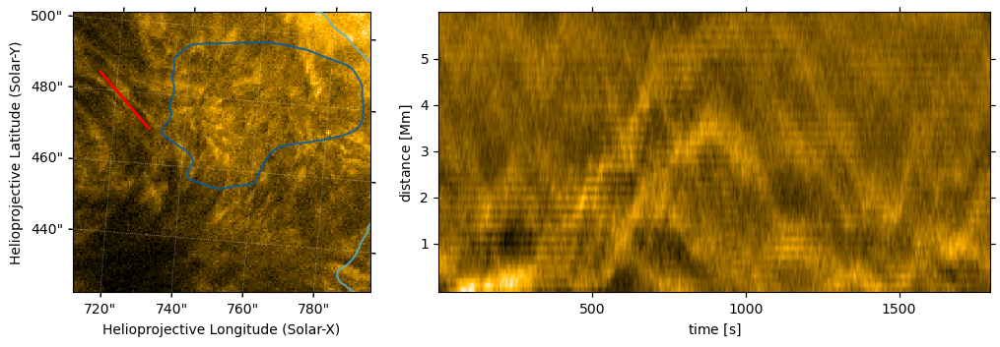

In [243]:
fig = plt.figure(figsize=(8,3))

ax1 = fig.add_axes([0,0.0,0.45,0.95],projection=eui_map_region_east_1)
ax2 = fig.add_axes([0.5,0.0,0.7,0.95],projection=slit_6_intensity_box_car_cube.wcs)

eui_map_region_east_1.plot(axes=ax1,title=None,norm=ImageNormalize(vmin=200,vmax=1.5e3,stretch=AsinhStretch(0.6)))
ax1.plot_coord(slit_6_coords, color="red", lw=2, ls="-")

slit_6_intensity_box_car_cube.plot(axes = ax2, plot_axes=('x','y'),cmap='sdoaia171',
                                    aspect="auto")

bounds = ax1.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax1)
ax1.axis(bounds)



In [307]:
slit_7_pixels_0, slit_7_pixels_0_distance, slit_7_pixels_0_all, slit_7_intensity = get_intensity_spacetime_cut_new(slit_7_coords,eui_map_seq_coalign,
                                                                                                                     thick=5)
slit_7_spacetime_distance_wcs = (QuantityTableCoordinate(slit_7_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_7_spacetime_distance_cube = NDCube(slit_7_intensity,slit_7_spacetime_distance_wcs)

<WCSAxes: >

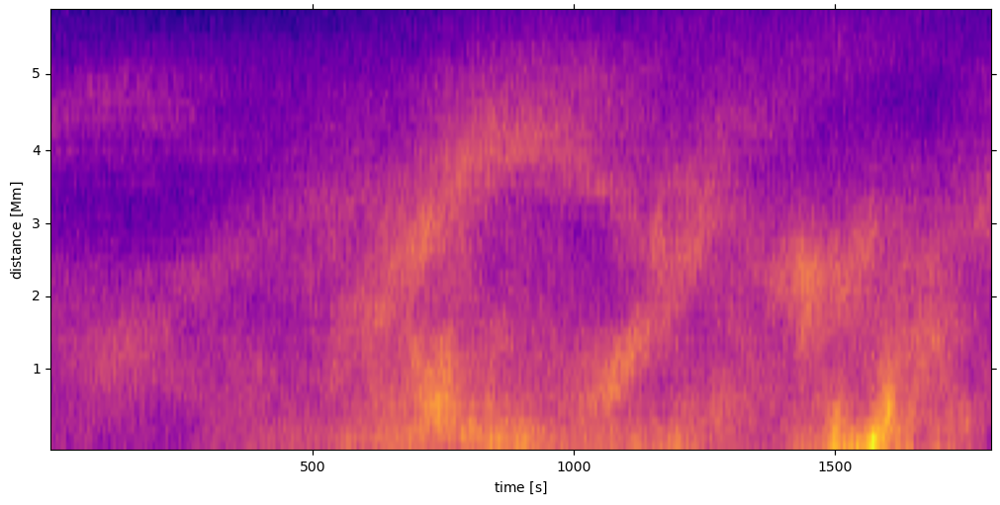

In [308]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_7_spacetime_distance_cube.wcs)
slit_7_spacetime_distance_cube = NDCube(slit_7_intensity,slit_7_spacetime_distance_wcs)
slit_7_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(stretch=AsinhStretch(0.7)),
                                    aspect="auto")

In [309]:
slit_7_box_car = cv2.GaussianBlur(slit_7_intensity,(29,1),15,0)

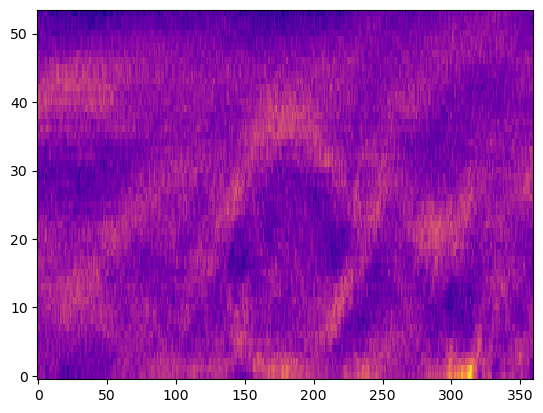

In [310]:
plt.imshow((slit_7_intensity - slit_7_box_car).T,origin="lower",aspect="auto",norm=ImageNormalize(),
           interpolation="none",cmap="plasma")

In [311]:
slit_8_pixels_0, slit_8_pixels_0_distance, slit_8_pixels_0_all, slit_8_intensity = get_intensity_spacetime_cut_new(slit_8_coords,eui_map_seq_coalign,
                                                                                                                        thick=3)
slit_8_spacetime_distance_wcs = (QuantityTableCoordinate(slit_8_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs
slit_8_spacetime_distance_cube = NDCube(slit_8_intensity,slit_8_spacetime_distance_wcs)

<WCSAxes: >

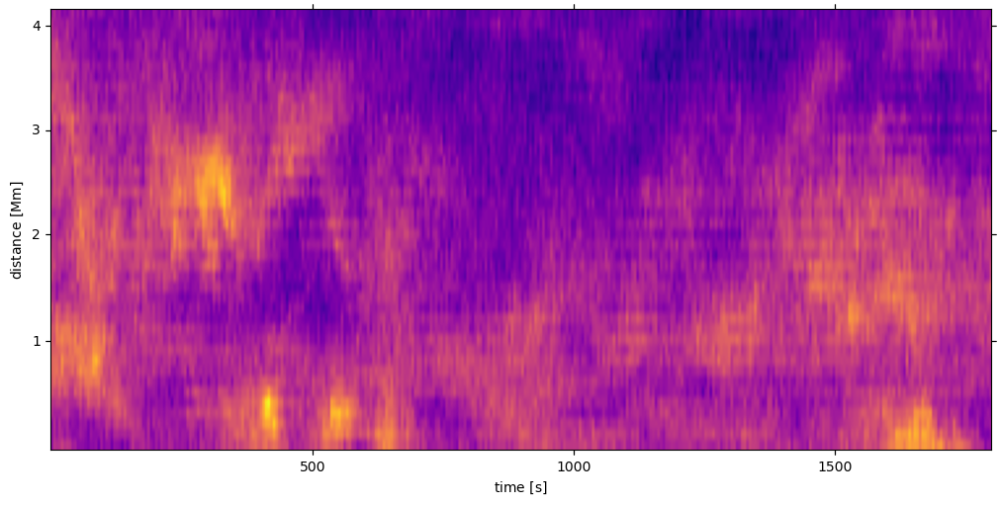

In [312]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_8_spacetime_distance_cube.wcs)
slit_8_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(stretch=AsinhStretch(0.7)),
                                    aspect="auto")

In [313]:
slit_8_box_car = cv2.GaussianBlur(slit_8_intensity,(29,1),15,0)

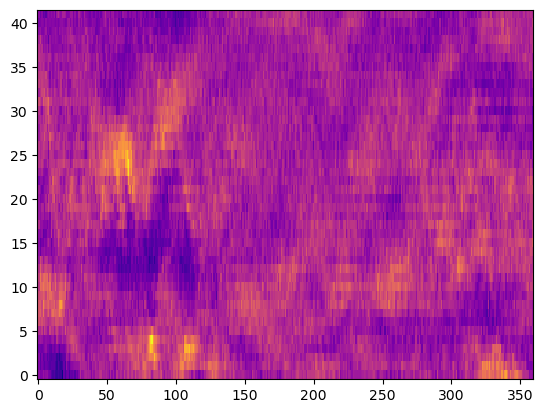

In [314]:
plt.imshow((slit_8_intensity - slit_8_box_car).T,origin="lower",aspect="auto",norm=ImageNormalize(),
           interpolation="none",cmap="plasma")

In [315]:
def get_pixel_boundaries(pixel_coord_all):
    bottom = pixel_coord_all[0][0]
    top = np.flip(pixel_coord_all[0][-1])

    left = np.flip(SkyCoord([item_[0] for item_ in pixel_coord_all[0][1:-1]]))
    right = SkyCoord([item_[-1] for item_ in pixel_coord_all[0][1:-1]])

    return SkyCoord([bottom,right,top,left])
    


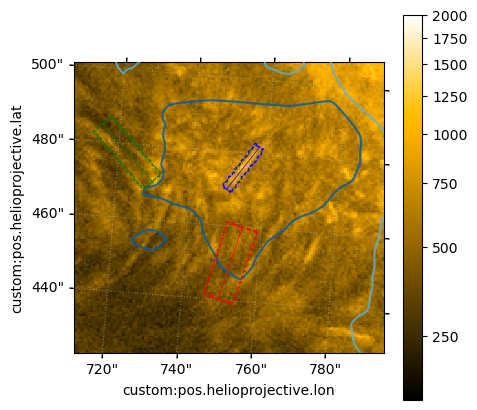

In [316]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
ax.imshow(eui_map_seq_coalign[12].data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(vmin=100,vmax=2e3,stretch=AsinhStretch(0.2)),
            interpolation="none")
plt.colorbar(ax.get_images()[0])

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(500,670)
ax.set_ylim(600,760)
ax.grid("on",ls=":",alpha=0.5)

ax.plot_coord(slit_6_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_7_coords, color="red", lw=0.5, ls="-")
ax.plot_coord(slit_8_coords, color="blue", lw=0.5, ls="-")

ax.plot_coord(get_pixel_boundaries(slit_6_pixels_0_all),color="green",lw=1,ls="--",alpha=0.9)
ax.plot_coord(get_pixel_boundaries(slit_7_pixels_0_all),color="red",lw=1,ls="--",alpha=0.9)
ax.plot_coord(get_pixel_boundaries(slit_8_pixels_0_all),color="blue",lw=1,ls="--",alpha=0.9)


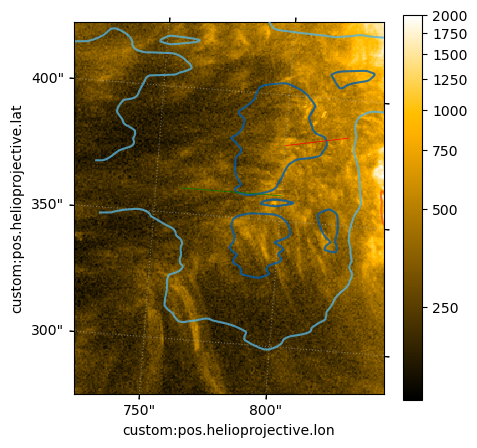

In [356]:
fig = plt.figure(figsize=(5,5))

ax = fig.add_subplot(111,projection=eui_map_wcs_all)
ax.imshow(eui_map_seq_coalign[12].data,origin="lower",cmap="solar orbiterhri_euv174",norm=ImageNormalize(vmin=100,vmax=2e3,stretch=AsinhStretch(0.1)),
            interpolation="none")
plt.colorbar(ax.get_images()[0])

bounds = ax.axis()
eis_195_velmap_derot_repro_hrifov.draw_contours(levels=[-10,-5,5,10],colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],alpha=0.8,
                                                                   axes=ax)
ax.set_xlim(500,750)
ax.set_ylim(300,600)
ax.grid("on",ls=":",alpha=0.5)

slit_9_coords = SkyCoord([800,760]*u.arcsec,
                            [360,360]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

slit_10_coords = SkyCoord([800,825]*u.arcsec,
                            [380,385]*u.arcsec,
                            frame=eui_map_181_shift.coordinate_frame)

ax.plot_coord(slit_9_coords, color="green", lw=0.5, ls="-")
ax.plot_coord(slit_10_coords, color="red", lw=0.5, ls="-")



In [357]:
slit_9_pixels_0, slit_9_pixels_0_distance, slit_9_pixels_0_all, slit_9_intensity = get_intensity_spacetime_cut_new(slit_9_coords,eui_map_seq_coalign,
                                                                                                                        thick=3)
slit_9_spacetime_distance_wcs = (QuantityTableCoordinate(slit_9_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_9_spacetime_distance_cube = NDCube(slit_9_intensity,slit_9_spacetime_distance_wcs)

<WCSAxes: >

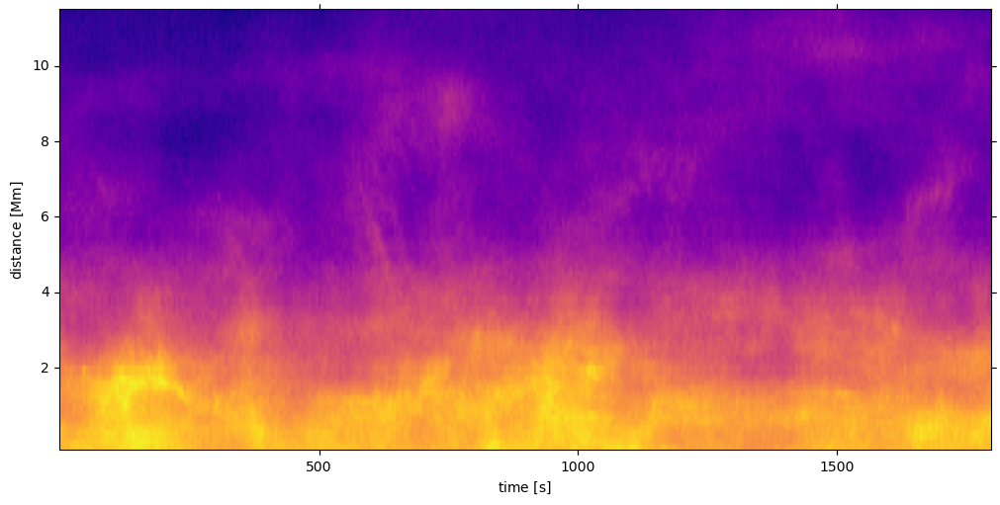

In [358]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_9_spacetime_distance_cube.wcs)
slit_9_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',norm=ImageNormalize(stretch=AsinhStretch(0.7)),
                                    aspect="auto")


In [359]:
slit_9_box_car = cv2.GaussianBlur(slit_9_intensity,(29,1),15,0)

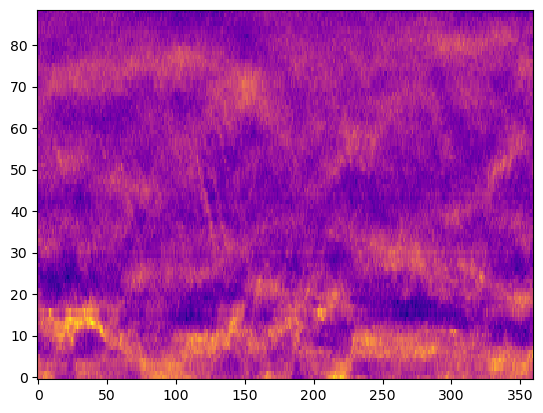

In [360]:
plt.imshow((slit_9_intensity - slit_9_box_car).T,origin="lower",aspect="auto",norm=ImageNormalize(),
           interpolation="none",cmap="plasma")

In [361]:
slit_10_pixels_0, slit_10_pixels_0_distance, slit_10_pixels_0_all, \
slit_10_intensity = get_intensity_spacetime_cut_new(slit_10_coords,eui_map_seq_coalign,thick=2)

slit_10_spacetime_distance_wcs = (QuantityTableCoordinate(slit_10_pixels_0_distance.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(astropy.time.Time([map_.date for map_ in eui_map_seq_coalign]),
                                            physical_types="time",names="time")).wcs

slit_10_spacetime_distance_cube = NDCube(slit_10_intensity,slit_10_spacetime_distance_wcs)

<WCSAxes: >

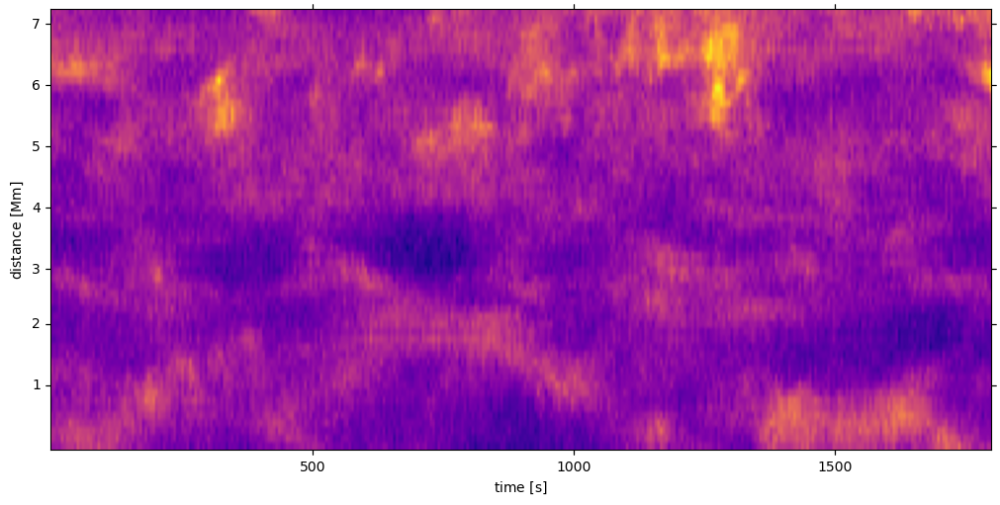

In [362]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)
ax = fig.add_subplot(111,projection=slit_10_spacetime_distance_cube.wcs)
slit_10_spacetime_distance_cube.plot(axes = ax, plot_axes=('x','y'),cmap='plasma',
                                     norm=ImageNormalize(stretch=AsinhStretch(0.7)),
                                    aspect="auto")



In [363]:
slit_10_box_car = cv2.GaussianBlur(slit_10_intensity,(29,1),15,0)

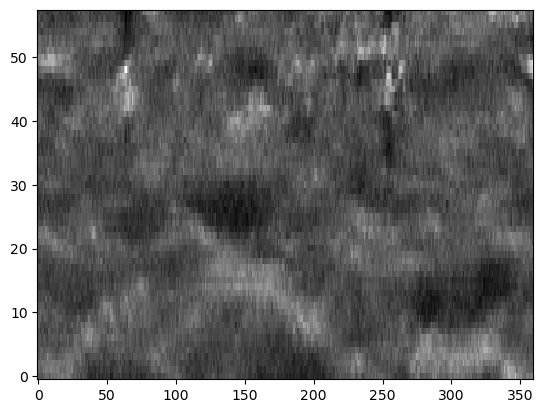

In [364]:
plt.imshow((slit_10_intensity - slit_10_box_car).T,origin="lower",aspect="auto",norm=ImageNormalize(),
           interpolation="none",cmap="gray")

In [88]:
iris_sji_cube = irispy.io.read_files("../../src/IRIS/20221024/1904/iris_l2_20221024_190447_3643101203_SJI_1400_t000.fits")
iris_sji_date_obs = iris_sji_cube.time.to_datetime()

In [123]:
eui_map_region_center_1 = eui_map_181_shift.submap([1100,700]*u.pix,top_right=[1260,900]*u.pix)

In [124]:
eui_map_region_center_1_wcs = deepcopy(eui_map_region_center_1.wcs)
eui_map_region_center_1_wcs.wcs.aux.rsun_ref = 696000000.0

In [125]:
iris_map_seq_center_1 = []

for ii in tqdm(range(477)):
    iris_map_ = sunpy.map.Map(iris_sji_cube[ii].data,iris_sji_cube[ii].meta)
    iris_map_.meta["rsun_ref"] = 696000000.0
    iris_map_date = iris_sji_date_obs[ii]
    iris_map_.meta["date_obs"] = iris_sji_cube[204:205].time.value[0]
    iris_map_ = iris_map_.rotate()
    iris_map_ = iris_map_.shift_reference_coord(-0.315062*u.arcsec,-0.00679948*u.arcsec)

    iris_map_seq_center_1.append(iris_map_.reproject_to(eui_map_region_center_1_wcs))


iris_map_seq_center_1 = sunpy.map.Map(iris_map_seq_center_1,sequence=True)



    





  0%|          | 0/477 [00:00<?, ?it/s]WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
  0%|          | 1/477 [00:00<02:07,  3.74it/s]WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the fo

In [136]:
def get_intensity_spacetime_cut_new_iris(slit_coords,map_seq,thick=1.5):
    pixels_0 = pixelate_coord_thick_path(map_seq[0],slit_coords,thick=thick)
    pixels_center = sunpy.map.pixelate_coord_path(map_seq[0],slit_coords)

    pixels_center_distance = np.zeros_like(pixels_center,dtype=np.float64)*u.arcsec

    slit_anchor_index = []
    for slit_anchor_ in slit_coords:
        slit_anchor_index.append(np.argmin(pixels_center.separation(slit_anchor_)))
    slit_anchor_distance = np.zeros_like(slit_anchor_index,dtype=np.float64)
    for ii, slit_anchor_index_ in enumerate(slit_anchor_index):
        if ii == 0:
            pass
        else:
            slit_anchor_distance[ii] = pixels_center[slit_anchor_index[ii]].separation(pixels_center[slit_anchor_index[ii-1]]).to_value(u.arcsec) + slit_anchor_distance[ii-1]
    
    slit_anchor_distance = slit_anchor_distance*u.arcsec

    for ii, slit_anchor_index_ in enumerate(slit_anchor_index[:-1]):
        for jj in range(slit_anchor_index[ii],slit_anchor_index[ii+1]):
            pixels_center_distance[jj] = slit_anchor_distance[ii] + pixels_center[jj].separation(pixels_center[slit_anchor_index_]).to(u.arcsec)
    pixels_center_distance[-1] = slit_anchor_distance[-1] 
    pixels_center_distance = pixels_center_distance.to_value(u.rad)*map_seq[181].dsun


    intensity = []
    for map_ in map_seq[:]:
        map_fake_ = map_
        intensity_ = np.zeros_like(pixels_center)
        for ii, slit_anchor_index_ in enumerate(slit_anchor_index[:-1]):
            pixels_ = pixels_0[ii]
            if ii == 0:
                intensity_[slit_anchor_index[ii]:slit_anchor_index[ii+1]+1] = \
                    np.nanmean(sunpy.map.sample_at_coords(map_fake_,pixels_.flatten()).reshape(pixels_.shape[0],pixels_.shape[1]),axis=1)
            else:
                intensity_[slit_anchor_index[ii]+1:slit_anchor_index[ii+1]+1] = \
                    np.nanmean(sunpy.map.sample_at_coords(map_fake_,pixels_.flatten()).reshape(pixels_.shape[0],pixels_.shape[1]),axis=1)
        intensity.append(intensity_)
    
    return pixels_center, pixels_center_distance, pixels_0, u.Quantity(intensity)

In [132]:
slit_3a_coords_iris = SkyCoord(slit_3a_coords.Tx,
                            slit_3a_coords.Ty,
                            frame=iris_map_seq_center_1[0].coordinate_frame)

In [137]:
slit_3a_pixels_0_iris,slit_3a_pixels_0_distance_iris, slit_3a_pixels_0_all_iris, slit_3a_intensity_iris = \
    get_intensity_spacetime_cut_new_iris(slit_3a_coords,iris_map_seq_center_1,thick=1)

slit

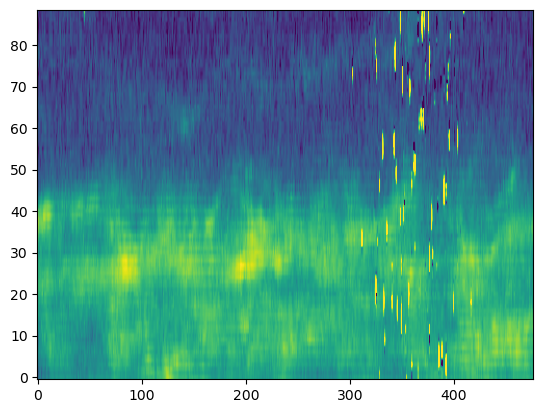

In [142]:
plt.imshow(slit_3a_intensity_iris.T,origin="lower",norm=ImageNormalize(vmin=0,vmax=30,stretch=AsinhStretch(0.1)),aspect="auto")

In [167]:
slit_3a_spacetime_distance_wcs_iris = (QuantityTableCoordinate(slit_3a_pixels_0_distance_iris.to(u.Mm),
                                                physical_types="length",names="distance") &
                        TimeTableCoordinate(iris_sji_cube.time,
                                            physical_types="time",names="time")).wcs

slit_3a_spacetime_distance_cube_iris = NDCube(slit_3a_intensity_iris,slit_3a_spacetime_distance_wcs_iris)
slit_3a_spacetime_distance_cube_iris = slit_3a_spacetime_distance_cube_iris[9:415,:]

<WCSAxes: >

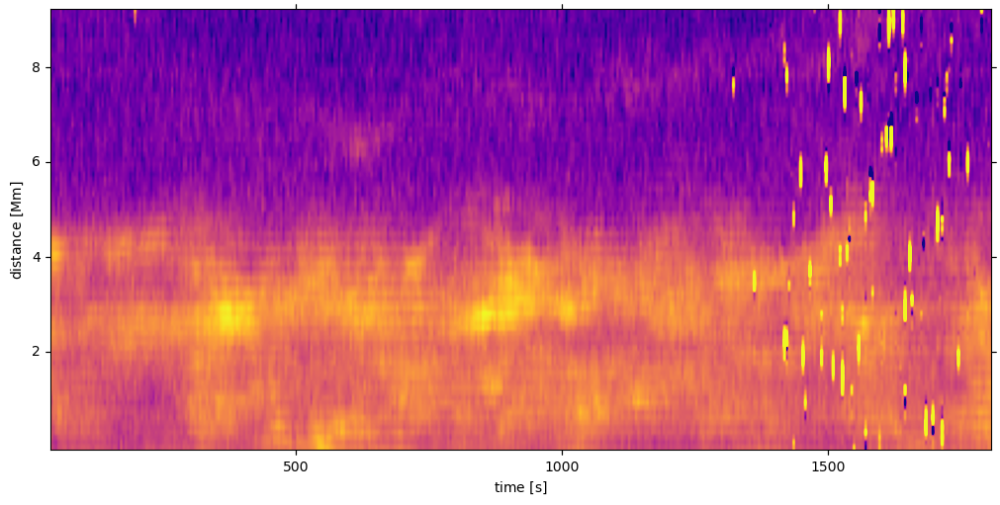

In [168]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax = fig.add_subplot(111,projection=slit_3a_spacetime_distance_cube_iris.wcs)
slit_3a_spacetime_distance_cube_iris.plot(axes = ax, plot_axes=('x','y'),cmap='plasma'
,norm=ImageNormalize(vmin=0,vmax=30,stretch=AsinhStretch(0.1)),
                                    aspect="auto")


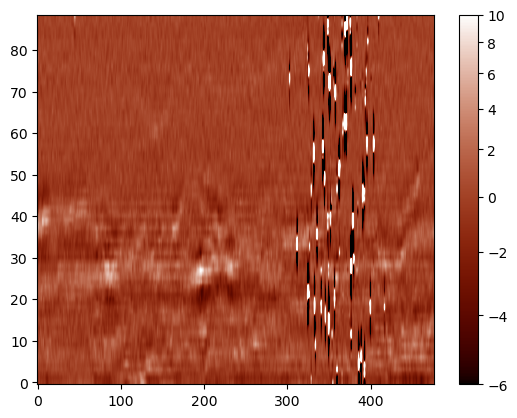

In [186]:
slit_3a_intensity_box_car_iris = cv2.GaussianBlur(slit_3a_intensity_iris,(15,1),5,0)
plt.imshow((slit_3a_intensity_iris - slit_3a_intensity_box_car_iris).T,aspect="auto",cmap="irissji1400",origin="lower",
            interpolation="gaussian",norm=ImageNormalize(vmin=-6,vmax=10,stretch=AsinhStretch(0.4)))
plt.colorbar()

In [190]:
slit_3a_intensity_box_car_cube = NDCube(slit_3a_intensity - slit_3a_intensity_box_car,slit_3a_spacetime_distance_wcs)
slit_3a_intensity_box_car_cube_iris = NDCube(slit_3a_intensity_iris - slit_3a_intensity_box_car_iris,slit_3a_spacetime_distance_wcs_iris)
slit_3a_intensity_box_car_cube_iris = slit_3a_intensity_box_car_cube_iris[9:415,:]

In [198]:
iris_sji_date_obs[210]

datetime.datetime(2022, 10, 24, 19, 19, 21, 640000)

<WCSAxes: >

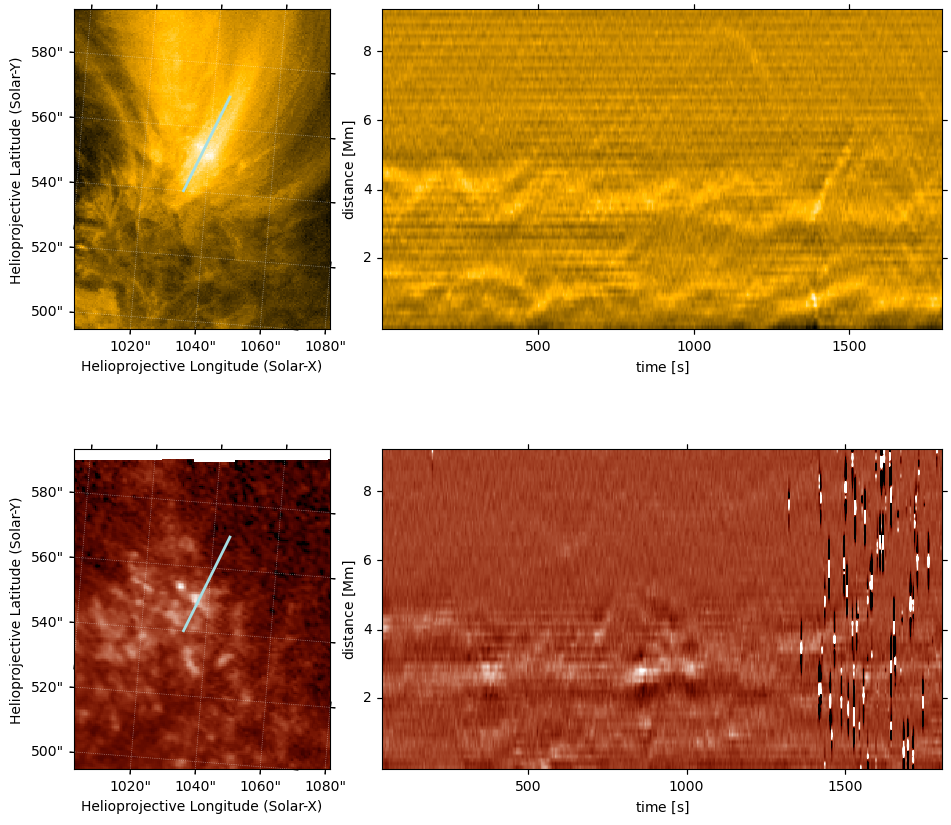

In [208]:
fig = plt.figure(figsize=(8,8))

ax1 = fig.add_axes([0,0.55,0.35,0.4],projection=eui_map_region_center_1)
ax2 = fig.add_axes([0.4,0.55,0.7,0.4],projection=slit_3a_intensity_box_car_cube.wcs)

eui_map_region_center_1.plot(axes=ax1,title=None)
ax1.plot_coord(slit_3a_coords_iris, color="#A5DEE4", lw=2, ls="-")

slit_3a_intensity_box_car_cube.plot(axes=ax2,plot_axes=('x','y'),cmap='sdoaia171',
                                    aspect="auto")

ax3 = fig.add_axes([0,0,0.35,0.4],projection=iris_map_seq_center_1[204])
ax4 = fig.add_axes([0.4,0,0.7,0.4],projection=slit_3a_intensity_box_car_cube_iris.wcs)

iris_map_seq_center_1[204].plot(axes=ax3,title=None,norm=ImageNormalize(vmin=0,vmax=30,stretch=AsinhStretch(0.2)))
ax3.plot_coord(slit_3a_coords, color="#A5DEE4", lw=2, ls="-")

slit_3a_intensity_box_car_cube_iris.plot(axes=ax4,plot_axes=('x','y'),cmap='irissji1400',
                                    aspect="auto",norm=ImageNormalize(vmin=-6,vmax=10,stretch=AsinhStretch(0.4)))

In [166]:
iris_sji_date_obs[414]

datetime.datetime(2022, 10, 24, 19, 34, 54, 550000)